In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from pyvis import network as net
import json
from os import listdir

import datashader as ds
import datashader.transfer_functions as tf
from datashader.bundling import hammer_bundle

/Users/sbidanta/miniconda3/envs/pygraphviz-env/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [2]:
pd.options.display.max_columns = None

Load the JSON files 

In [3]:
def load_data(directory):
    # Load json files 
    json_data_asctb = {}
    for filename in listdir(directory):
        if '.json' in filename:
            #print(filename)
            with open(f'{directory}{filename}', encoding='utf8') as json_file:
                data = json.load(json_file)

            json_data_asctb[filename[:-5]] = data
        #print(json_data_asctb)
    return json_data_asctb

In [4]:
json_data_asctb=load_data('data/v16/') ## Download the JSON files from ASCT+B Reporter

In [5]:
json_data_asctb #view the data

{'blood': {'nodes': [{'id': 0,
    'type': 'AS',
    'name': 'Body',
    'metadata': {'name': 'Body',
     'ontologyId': 'UBERON:0013702',
     'ontologyType': 'UBERON',
     'ontologyTypeId': '0013702',
     'label': 'body proper',
     'references': [{'id': 'HTTPS:DOIORG103389FIMMU201200302', 'notes': ''}]}},
   {'id': 1,
    'type': 'AS',
    'name': 'Blood',
    'metadata': {'name': 'Blood',
     'ontologyId': 'UBERON:0000178',
     'ontologyType': 'UBERON',
     'ontologyTypeId': '0000178',
     'label': 'Blood',
     'references': [{'id': 'HTTPS:DOIORG103389FIMMU201200302', 'notes': ''}]}},
   {'id': 2,
    'type': 'CT',
    'name': 'B lineage',
    'metadata': {'name': 'B lineage',
     'ontologyId': 'CL:0000945',
     'ontologyType': 'CL',
     'ontologyTypeId': '0000945',
     'label': 'lymphocyte of B lineage',
     'references': [{'id': 'HTTPS:DOIORG103389FIMMU201200302', 'notes': ''}]}},
   {'id': 3,
    'type': 'CT',
    'name': 'immature B cell',
    'metadata': {'name': 

Order of the organs

In [6]:
organ_order = ['bone_marrow', 'brain', 'eye', 'fallopian_tube', 'heart', 'kidney', 'knee',' large_intestine', 'liver', 'lung', 'lymph_nodes',
               'main_bronchus', 'trachea',  'spinal_cord', 'skin', 'thymus', 'spleen', 'pancreas', 'small_intestine', 'urinary_bladder', 
               'ureter', 'prostate', 'palatine_tonsil', 'ovary',  'uterus', 'placenta_full_term']

In [7]:
print('New organs:')
[organ for organ in json_data_asctb.keys() if organ not in organ_order+['blood', 'blood_vasculature', 'lymph_vasculature', 'peripheral_nervous_system']]

New organs:


['large_intestine', 'skeleton', 'muscular_system']

In [8]:
json_data_asctb = {organ: json_data_asctb[organ] for organ in organ_order}

KeyError: ' large_intestine'

In [ ]:
json_data_asctb.keys()

In [10]:
def combine_data(json_dat, remove_ctct=True, combine=True, blood=False, verbose=False):
    """
    combine_data takes the json data of the organs and returns the node and edge lists in pandas dataframes

    :param json_dat: data of all the organs in a json format that was loaded by the load_data function
    :param remove_ctct: There should not be edges between CT and CT, however sometimes there can be mistakes in the data files. 
    :param combine: if true then the organs are combined into one network, and the function outputs 2 dataframes: nodes and edges. 
                    if false, then the organs are not combined, the function returns a node and an edge table for each organ.
    :param blood: By default it is false, and in this case, the function ignores the following tables: 'blood_pelvis', 'blood_vasculature', 
                 'lymph_vasculature', and 'peripheral_nervous_system'. If true, then 'blood_vasculature' is not excluded.

    """ 
    nodes_data = []
    edges_data = []
    organ_names = ['body']
    
    # The numbering of the nodes starts from 1 in each organ
    # If we combine the organs, we need a new id
    node_id_start_point = 1 
    
    #Add the 'body' node to the nodes data:
    body_df = pd.DataFrame(json_dat['brain']['nodes']).head(1)
    body_df.index = body_df['id']
    body_df['id_old'] = 0
    body_df['organ'] = 'body'
    body_df['ontology_id'] = 'UBERON:0013702'
    
    nodes_data += [body_df[['id', 'id_old', 'name', 'type', 'organ', 'ontology_id']]]
    
    if not combine:
        body_data = body_df[['id', 'id_old', 'name', 'type', 'organ', 'ontology_id']].copy()
    
    if blood:
        exclude = ['blood_pelvis', 'lymph_vasculature', 'peripheral_nervous_system']
    else:
        exclude = ['blood_pelvis', 'blood_vasculature', 'lymph_vasculature', 'peripheral_nervous_system']
    
    for name in json_dat.keys():
        if name in exclude:
            continue
        else:
            # print(name)
            organ_names += [name]
            # Combine nodes:
            organ_nodes = pd.DataFrame(json_dat[name]['nodes']).iloc[1:,:]
            not_as_ct_nodes = organ_nodes[~organ_nodes['type'].isin(['AS', 'CT'])]['id'] #filter for AS and CT
            organ_nodes['id_old'] = organ_nodes['id'].copy()
            if combine:
                organ_nodes['id'] = organ_nodes['id'].add(node_id_start_point-1)
            organ_nodes.index = organ_nodes['id']
            # organ_nodes = organ_nodes.drop(columns=['id'])
            organ_nodes = organ_nodes[organ_nodes['type'].isin(['AS', 'CT'])]
            organ_nodes['organ'] = name
            organ_nodes['ontology_id'] = organ_nodes['metadata'].apply(lambda x: x['ontologyId'])
            organ_nodes = organ_nodes[['id', 'id_old', 'name', 'type', 'organ', 'ontology_id']]
            

            # Combine edges:
            organ_edges = pd.DataFrame(json_dat[name]['edges'])
            ## Remove CT-CT edges:
            if remove_ctct:
                organ_nodes_original = pd.DataFrame(json_dat[name]['nodes'])
                organ_nodes_original.index = organ_nodes_original['id']
                organ_edges['source_type'] = organ_edges['source'].apply(lambda x: organ_nodes_original.loc[x]['type'])
                organ_edges['target_type'] = organ_edges['target'].apply(lambda x: organ_nodes_original.loc[x]['type'])
                organ_edges = organ_edges[(organ_edges['source_type']=='AS')|(organ_edges['target_type']=='AS')]
            ##rename edges due to colliding ids
            organ_network = nx.from_pandas_edgelist(organ_edges)
            #remove unnecessary edges:
            organ_network.remove_nodes_from(not_as_ct_nodes.to_list())
            # Remove body-organ edge (we will add it later)
            organ_network.remove_edge(0, 1)
            organ_network.remove_node(0)
            #rename nodes
            # organ_network = nx.relabel_nodes(organ_network, organ_nodes['name'].to_dict())
            if combine:
                organ_network = nx.convert_node_labels_to_integers(organ_network, first_label=node_id_start_point)
            #add body-organ edge
            # organ_network.add_node(0) 
            # nx.set_node_attributes(organ_network, {0: {"type": 'AS', "name": "Body", 'organ': 'body', 'ontology_id': 'UBERON:0013702'}})
            if combine:
                organ_network.add_edge(0, node_id_start_point) #add body-organ edge
                #v1.4 correction:
                if name=='lung':
                    organ_network.add_edge(node_id_start_point, 63+node_id_start_point-1)  #connect lung to pulmonary vascular system
                    organ_network.add_edge(node_id_start_point, 1+node_id_start_point-1)  #connect lung to respiratory system
                    organ_network.add_edge(node_id_start_point, 69+node_id_start_point-1)  #connect lung to systemic artery
                    organ_network.add_edge(node_id_start_point, 73+node_id_start_point-1)  #connect lung to venous blood vessel

                elif name=='trachea':
                    organ_network.add_edge(node_id_start_point, 15+node_id_start_point-1)  #connect trachea to bronchial vein
                    organ_network.add_edge(node_id_start_point, 18+node_id_start_point-1)  #connect trachea to bronchial artery
                    
                elif name=='main_bronchus':
                    organ_network.add_edge(node_id_start_point, 10+node_id_start_point-1) #connect trachea to bronchial artery
                    organ_network.add_edge(node_id_start_point, 13+node_id_start_point-1) #connect trachea to bronchial vein
                    
            else:
                organ_network.add_edge(0, 1) #add body-organ edge
                
                #v1.4 corrections:
                if name=="lung":
                    organ_network.add_edge(0, 1) #connect lung to respiratory system
                    organ_network.add_edge(0, 63) #connect lung to pulmonary vascular system
                    organ_network.add_edge(0, 69) #connect lung to systemic artery
                    organ_network.add_edge(0, 73) #connect lung to venous blood vessel

                elif name=="trachea":
                    organ_network.add_edge(0, 15) #connect trachea to bronchial vein
                    organ_network.add_edge(0, 18) #connect trachea to bronchial artery

                elif name=='main_bronchus':
                    organ_network.add_edge(0, 10) #connect trachea to bronchial artery
                    organ_network.add_edge(0, 13) #connect trachea to bronchial vein


                

            # Create CT duplicates
            organ_CT_nodes = organ_nodes[organ_nodes['type']=='CT'].copy()
            organ_CT_nodes['degree'] = dict(organ_network.degree(organ_CT_nodes['id'])).values()
            
            ct_nodes_to_copy = organ_CT_nodes[organ_CT_nodes['degree']>1]['id'].values
            edges_to_remove = []
            edges_to_add = []
            
            for ct_node in ct_nodes_to_copy:
                as_neighbors_of_ct = list(nx.neighbors(organ_network, ct_node))
                for ind, as_neighbor in enumerate(as_neighbors_of_ct):
                    if ind==0:
                        continue
                    else:
                        ct_node_details = organ_nodes.loc[ct_node].to_dict()
                        new_node_id = organ_nodes['id'].max()+1
                        ct_node_details['id'] = new_node_id
                        # organ_nodes = organ_nodes.append(ct_node_details, ignore_index=False)
                        organ_nodes.loc[new_node_id] = ct_node_details
                        
                        edges_to_remove += [(as_neighbor, ct_node)]
                        edges_to_add += [(as_neighbor, new_node_id)]

            if verbose:
                print(name)
                print(f'Number of deleted edges: {len(edges_to_remove)}')
                print(f'Number of added edges: {len(edges_to_add)}')
                
            organ_network.remove_edges_from(edges_to_remove)
            organ_network.add_edges_from(edges_to_add)               
            
            print(nodes_data)
            nodes_data += [organ_nodes]
            if not combine:
                nodes_data[-1] = pd.concat([body_data, nodes_data[-1]])
            
            node_id_start_point = max(organ_network.nodes)+1
            
            organ_edges = nx.to_pandas_edgelist(organ_network)[['source', 'target']]
            print(f"{name} is tree: {nx.is_tree(organ_network)}", end='\n_____________\n')
            edges_data += [organ_edges]

    if combine:
        return pd.concat(nodes_data, ignore_index=True), pd.concat(edges_data, ignore_index=True)
    else:
        return dict(zip(organ_names, nodes_data)), dict(zip(organ_names[1:], edges_data))

Combine the nodes and edges of the organs. (The code checks whether the graph of the organs are trees)

In [11]:
nodes, edges = combine_data(json_data_asctb, remove_ctct=True, combine=True)

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702]
blood is tree: True
_____________
[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                               name type  organ     ontology_id
id                                                                           
1    1       1                              Blood   AS  blood  UBERON:0000178
2    2       2                          B lineage   CT  blood      CL:0000945
3    3       3                    immature B cell   CT  blood      CL:0000816
4    4       4                      memory B cell   CT  blood      CL:0000787
5    5       5                       naive B cell   CT  blood      CL:0000788
6    6       6                transitional B cell   CT  blood      CL:0000818
7    7       7                dendritic cell (DC) 

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

In [14]:
nodes[nodes['organ'] == 'lung']

,id,id_old,name,type,organ,ontology_id
2819,2819,1,respiratory system,AS,lung,UBERON:0001004
2820,2820,2,respiratory tract,AS,lung,UBERON:0000065
2821,2821,3,lower respiratory tract,AS,lung,UBERON:0001558
2822,2822,4,tracheobronchial tree,AS,lung,UBERON:0007196
2823,2823,5,pulmonary nerve plexus,AS,lung,UBERON:0002009
...,...,...,...,...,...,...
2988,2988,111,adventitial fibroblast,CT,lung,CL:4028006
2989,2989,111,adventitial fibroblast,CT,lung,CL:4028006
2990,2990,112,alveolar type 1 fibroblast cell,CT,lung,CL:4028004
2991,2991,112,alveolar type 1 fibroblast cell,CT,lung,CL:4028004


In [15]:
edges.head()

,source,target
0,1,2
1,1,3
2,1,4
3,1,5
4,1,6


In [16]:
FTUs = ['UBERON:0001229', 'UBERON:0001285', 'UBERON:0004205', 'UBERON:0004204', 'UBERON:0004203', 'UBERON:0004193', 'UBERON:0001289', 'UBERON:0001291', 'UBERON:0013485', 'UBERON:0004647', 'UBERON:0008870', 'UBERON:8410043', 'UBERON:0000006', 'UBERON:0001263', 'UBERON:0007329', 'UBERON:0004179', 'UBERON:0001003', 'UBERON:0002067', 'UBERON:0001213', 'UBERON:0001959', 'UBERON:0001250', 'UBERON:0002125']

In [18]:
len(FTUs)

22

In [17]:
nodes[nodes['ontology_id'].isin(FTUs)]['ontology_id'].unique()

array(['UBERON:0001250', 'UBERON:0001959', 'UBERON:0013485',
       'UBERON:0001003', 'UBERON:0002067', 'UBERON:0002125',
       'UBERON:8410043', 'UBERON:0004203', 'UBERON:0001291',
       'UBERON:0001289', 'UBERON:0001285', 'UBERON:0001229',
       'UBERON:0004193', 'UBERON:0004204', 'UBERON:0004205',
       'UBERON:0004647', 'UBERON:0001263', 'UBERON:0007329',
       'UBERON:0000006', 'UBERON:0008870', 'UBERON:0004179'], dtype=object)

## Construction of network 

In [19]:
whole_graph = nx.from_pandas_edgelist(edges)

In [20]:
def get_parent(node, graph):
    neighbors = nx.neighbors(graph, node)
    # print(len([x for x in neighbors if x<node]))
    return min(nx.neighbors(graph, node))

In [21]:
nodes['parent']= nodes['id'].apply(get_parent, graph=whole_graph)

Size of network in v1.4

In [22]:
whole_graph.number_of_nodes()

6599

In [23]:
whole_graph.number_of_edges()

6599

In [28]:
nodes['color'] = nodes.apply(lambda row: '#56a04e' if row['ontology_id'] in FTUs else ('#984ea0' if row['type']=='AS' else '#ff7f00'), axis=1)

In [29]:
nodes_json = nodes[['id', 'name', 'parent', 'type', 'ontology_id', 'color']].to_dict(orient='index')

In [30]:
nodes_json[0]['parent']

1

In [31]:
del(nodes_json[0]['parent'])

In [32]:
nodes_json = [nodes_json[i] for i in nodes_json.keys()]

In [33]:
with open('human_atlas_v1.4', 'w', encoding='utf8') as f:
    f.write('[\n')
    for item in nodes_json:
        f.write(f"{json.dumps(item)},\n".replace("'", ''))
    f.write(']')

In [34]:
nodes['type'].value_counts()

type
CT    3483
AS    3116
Name: count, dtype: int64

### Female network 

In [35]:
def construct_network(jason_data, filename):
    nodes_df, edges_df = combine_data(jason_data, remove_ctct=True, combine=True)
    graph = nx.from_pandas_edgelist(edges_df)
    nodes_df['parent']= nodes_df['id'].apply(get_parent, graph=graph)
    nodes_df['color'] = nodes_df.apply(lambda row: '#56a04e' if row['ontology_id'] in FTUs else ('#984ea0' if row['type']=='AS' else '#ff7f00'), axis=1)
    
    nodes_df['organ_label'] = nodes_df.apply(lambda row: row['name'] if row['id_old']==1 else '', axis=1)
    nodes_json = nodes_df[['id', 'name', 'parent', 'type', 'ontology_id', 'color', 'organ', 'organ_label']].to_dict(orient='index')
    del(nodes_json[0]['parent'])
    nodes_json = [nodes_json[i] for i in nodes_json.keys()]
    
    with open(f'{filename}.json', 'w', encoding='utf8') as f:
        f.write('[\n')
        for item in nodes_json:
            f.write(f"{json.dumps(item)},\n".replace("'", ''))
        f.write(']')
    
    return nodes_df, edges_df

In [36]:
fem_json_data = json_data_asctb.copy()

In [39]:
fem_json_data.keys()

dict_keys(['blood', 'placenta_full_term', 'spleen', 'large_intestine', 'lymph_vasculature', 'brain', 'lymph_nodes', 'palatine_tonsil', 'blood_vasculature', 'thymus', 'ovary', 'main_bronchus', 'uterus', 'spinal_cord', 'urinary_bladder', 'bone_marrow', 'skin', 'kidney', 'liver', 'pancreas', 'lung', 'skeleton', 'heart', 'peripheral_nervous_system', 'eye', 'trachea', 'fallopian_tube', 'small_intestine', 'knee', 'muscular_system', 'ureter'])

In [37]:
del(fem_json_data['prostate'])

In [40]:
fem_nodes, fem_edges = construct_network(fem_json_data, 'data/output/female')

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702]
blood is tree: True
_____________
[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                               name type  organ     ontology_id
id                                                                           
1    1       1                              Blood   AS  blood  UBERON:0000178
2    2       2                          B lineage   CT  blood      CL:0000945
3    3       3                    immature B cell   CT  blood      CL:0000816
4    4       4                      memory B cell   CT  blood      CL:0000787
5    5       5                       naive B cell   CT  blood      CL:0000788
6    6       6                transitional B cell   CT  blood      CL:0000818
7    7       7                dendritic cell (DC) 

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

In [41]:
fem_edges

,source,target
0,1,2
1,1,3
2,1,4
3,1,5
4,1,6
...,...,...
6561,6550,6561
6562,6550,6562
6563,6550,6563
6564,6550,6564


In [42]:
fem_nodes[fem_nodes['organ']=='prostate']

,id,id_old,name,type,organ,ontology_id,parent,color,organ_label


In [43]:
fem_nodes.color.value_counts()

color
#ff7f00    3464
#984ea0    3048
#56a04e      54
Name: count, dtype: int64

In [44]:
fem_nodes[fem_nodes['color']=='#56a04e'].sort_values('ontology_id') #.to_excel('ftus.xlsx')

,id,id_old,name,type,organ,ontology_id,parent,color,organ_label
2664,2664,21,Islet of Langerhans,AS,pancreas,UBERON:0000006,2663,#56a04e,
2769,2769,126,Islet of Langerhans,AS,pancreas,UBERON:0000006,2768,#56a04e,
2751,2751,108,Islet of Langerhans,AS,pancreas,UBERON:0000006,2750,#56a04e,
2690,2690,47,Islet of Langerhans,AS,pancreas,UBERON:0000006,2689,#56a04e,
2733,2733,90,Islet of Langerhans,AS,pancreas,UBERON:0000006,2732,#56a04e,
2712,2712,69,Islet of Langerhans,AS,pancreas,UBERON:0000006,2711,#56a04e,
2383,2383,2,Epidermis,AS,skin,UBERON:0001003,2382,#56a04e,
581,581,272,epidermis,AS,large_intestine,UBERON:0001003,580,#56a04e,
2481,2481,28,Renal Corpuscle,AS,kidney,UBERON:0001229,2480,#56a04e,
146,146,8,Red Pulp,AS,spleen,UBERON:0001250,140,#56a04e,


### Male network 

In [45]:
male_json_data = json_data_asctb.copy()

In [46]:
del(male_json_data['fallopian_tube'])

In [47]:
del(male_json_data['ovary'])

In [48]:
del(male_json_data['uterus'])

In [49]:
del(male_json_data['placenta_full_term'])

In [50]:
male_nodes, male_edges = construct_network(male_json_data, 'data/output/male')

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702]
blood is tree: True
_____________
[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                               name type  organ     ontology_id
id                                                                           
1    1       1                              Blood   AS  blood  UBERON:0000178
2    2       2                          B lineage   CT  blood      CL:0000945
3    3       3                    immature B cell   CT  blood      CL:0000816
4    4       4                      memory B cell   CT  blood      CL:0000787
5    5       5                       naive B cell   CT  blood      CL:0000788
6    6       6                transitional B cell   CT  blood      CL:0000818
7    7       7                dendritic cell (DC) 

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

In [51]:
male_nodes

,id,id_old,name,type,organ,ontology_id,parent,color,organ_label
0,0,0,Body,AS,body,UBERON:0013702,1,#984ea0,
1,1,1,Blood,AS,blood,UBERON:0000178,0,#984ea0,Blood
2,2,2,B lineage,CT,blood,CL:0000945,1,#ff7f00,
3,3,3,immature B cell,CT,blood,CL:0000816,1,#ff7f00,
4,4,4,memory B cell,CT,blood,CL:0000787,1,#ff7f00,
...,...,...,...,...,...,...,...,...,...
6062,6062,29,perictye,CT,prostate,CL:0000669,6040,#ff7f00,
6063,6063,30,basal cell of urothelium,CT,prostate,CL:1000486,6047,#ff7f00,
6064,6064,31,basal cell of prostatic urethra,CT,prostate,,6047,#ff7f00,
6065,6065,32,club epithelia,CT,prostate,CL:4032000,6047,#ff7f00,


In [52]:
male_edges

,source,target
0,1,2
1,1,3
2,1,4
3,1,5
4,1,6
...,...,...
6062,6046,6061
6063,6047,6063
6064,6047,6064
6065,6047,6065


In [53]:
male_nodes[male_nodes['name'].apply(lambda x: 'prostate' in str(x).lower())]

,id,id_old,name,type,organ,ontology_id,parent,color,organ_label
6034,6034,1,prostate gland,AS,prostate,UBERON:0002367,0,#984ea0,prostate gland
6035,6035,2,prostate epithelium,AS,prostate,UBERON:0000428,6034,#984ea0,
6036,6036,3,Prostate Glandular Acinus,AS,prostate,UBERON:0004179,6035,#56a04e,
6037,6037,4,prostate stroma,AS,prostate,UBERON:0004184,6034,#984ea0,
6038,6038,5,prostate gland smooth muscle,AS,prostate,UBERON:0004243,6037,#984ea0,
6052,6052,19,prostate smooth muscle,CT,prostate,CL:1000487,6038,#ff7f00,


# Vega radial tree 

* Config saved in (fe)male_wing_viz.json. 
* Copy human_atlas_(fe)_male_v13 in the values 
* Export SVG and JSON. 

In [54]:
def construct_network_create_vega_viz(jason_data, filename):
    nodes_df, edges_df = combine_data(jason_data, remove_ctct=True, combine=True)
    graph = nx.from_pandas_edgelist(edges_df)
    nodes_df['parent']= nodes_df['id'].apply(get_parent, graph=graph)
    nodes_df['color'] = nodes_df.apply(lambda row: '#56a04e' if row['ontology_id'] in FTUs else ('#984ea0' if row['type']=='AS' else '#ff7f00'), axis=1)
    
    nodes_df['organ_label'] = nodes_df.apply(lambda row: row['name'] if row['id_old']==1 else '', axis=1)
    nodes_json = nodes_df[['id', 'name', 'parent', 'type', 'ontology_id', 'color', 'organ', 'organ_label']].to_dict(orient='index')
    del(nodes_json[0]['parent'])
    nodes_json = [nodes_json[i] for i in nodes_json.keys()]
    

    with open('data/output/vega_config.json', encoding='utf8') as json_file:
        config = json.load(json_file)

    config['data'][0]['values'] = nodes_json
    
    
    # Writing to sample.json
    with open(f"data/output/v16_{filename}.json", "w") as outfile:
        outfile.write(json.dumps(config, indent=4))
    
    return nodes_df, edges_df

In [55]:
_, _ = construct_network_create_vega_viz(male_json_data, 'male')

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702]
blood is tree: True
_____________
[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                               name type  organ     ontology_id
id                                                                           
1    1       1                              Blood   AS  blood  UBERON:0000178
2    2       2                          B lineage   CT  blood      CL:0000945
3    3       3                    immature B cell   CT  blood      CL:0000816
4    4       4                      memory B cell   CT  blood      CL:0000787
5    5       5                       naive B cell   CT  blood      CL:0000788
6    6       6                transitional B cell   CT  blood      CL:0000818
7    7       7                dendritic cell (DC) 

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

In [56]:
_, _ = construct_network_create_vega_viz(fem_json_data, 'female')

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702]
blood is tree: True
_____________
[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                               name type  organ     ontology_id
id                                                                           
1    1       1                              Blood   AS  blood  UBERON:0000178
2    2       2                          B lineage   CT  blood      CL:0000945
3    3       3                    immature B cell   CT  blood      CL:0000816
4    4       4                      memory B cell   CT  blood      CL:0000787
5    5       5                       naive B cell   CT  blood      CL:0000788
6    6       6                transitional B cell   CT  blood      CL:0000818
7    7       7                dendritic cell (DC) 

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                                           name type  \
id                                                                   
1    1       1                                    Bone marrow   AS   
2    2       2                                      B lineage   CT   
3    3       3                               precursor B cell   CT   
4    4       4                                immature B cell   CT   
5    5       5                                  memory B cell   CT   
6    6       6                                   naive B cell   CT   
7    7       7                                    plasma cell   CT   
8    8       8                               pro B progenitor   CT   
9    9       9                            transitional B cell   CT   
10  10      10                                 dendritic cell   CT   
11  11      11

# Vasculature 

In [57]:
asctb_blood_vasc_nodes = pd.DataFrame(load_data('data/v16/')['blood_vasculature']['nodes'])

In [58]:
asctb_blood_vasc_nodes['ontologyId'] = asctb_blood_vasc_nodes['metadata'].apply(lambda x: x['ontologyId'])
asctb_blood_vasc_nodes['label'] = asctb_blood_vasc_nodes['metadata'].apply(lambda x: x['label'])
asctb_blood_vasc_nodes.drop(columns=['metadata'], inplace=True)

In [59]:
asctb_blood_vasc_nodes.head()

,id,type,name,ontologyId,label
0,0,AS,Body,UBERON:0013702,body proper
1,1,AS,blood vasculature,UBERON:0004537,blood vasculature
2,2,AS,left atrium,UBERON:0002079,left cardiac atrium
3,3,AS,left inferior pulmonary vein,FMA:49913,Left inferior pulmonary vein
4,4,AS,left superior pulmonary vein,FMA:49916,Left superior pulmonary vein


In [60]:
asctb_blood_vasc_nodes['type'].value_counts()

type
AS    1083
CT      10
BM      10
Name: count, dtype: int64

In [61]:
asctb_blood_vasc_edges = pd.DataFrame(load_data('data/v16/')['blood_vasculature']['edges'])

In [62]:
asctb_blood_vasc_edges

,source,target
0,0,1
1,1,2
2,2,3
3,2,4
4,2,5
...,...,...
12723,1089,1098
12724,1090,1099
12725,1090,1100
12726,1090,1101


In [63]:
vasc_data = pd.read_csv('data/Vessel.csv', encoding="ISO-8859-1")[['BranchesFrom', 'Vessel', 'ASID', 'VesselType', 'BodyPart', 'BodyPartID', 'PathFromHeart', 'PathFromHeartWithIDs']]

In [64]:
vasc_data.isna().sum().sort_values(ascending=False)

ASID                    179
BranchesFrom              0
Vessel                    0
VesselType                0
BodyPart                  0
BodyPartID                0
PathFromHeart             0
PathFromHeartWithIDs      0
dtype: int64

In [65]:
vasc_data.head()

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs
0,left atrium,left atrium,UBERON:0002079,heart chamber,heart chamber,UBERON:0004151,left atrium,left atrium;left cardiac atrium;UBERON:0002079
1,left atrium,left inferior pulmonary vein,fma49913,vein,lung,UBERON:0002048,left atrium;left inferior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...
2,left atrium,left superior pulmonary vein,fma49916,vein,lung,UBERON:0002048,left atrium;left superior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...
3,left atrium,pulmonary vein,UBERON:0002016,vein,lung,UBERON:0002048,left atrium;pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...
4,pulmonary vein,segmental pulmonary vein,fma9411,vein,lung,UBERON:0002048,left atrium;pulmonary vein;segmental pulmonary...,left atrium;left cardiac atrium;UBERON:0002079...


In [66]:
len(vasc_data)

1030

In [67]:
# vasc_data = pd.read_excel('./Blood_Vasculature_v1.2_EXTENDED.xlsx', sheet_name='BodyPartVessel')
# vasc_data = pd.read_excel('./Blood_Vasculature_v1.3_EXTENDED.xlsx', sheet_name='BodyPartVessel')
vasc_data

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs
0,left atrium,left atrium,UBERON:0002079,heart chamber,heart chamber,UBERON:0004151,left atrium,left atrium;left cardiac atrium;UBERON:0002079
1,left atrium,left inferior pulmonary vein,fma49913,vein,lung,UBERON:0002048,left atrium;left inferior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...
2,left atrium,left superior pulmonary vein,fma49916,vein,lung,UBERON:0002048,left atrium;left superior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...
3,left atrium,pulmonary vein,UBERON:0002016,vein,lung,UBERON:0002048,left atrium;pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...
4,pulmonary vein,segmental pulmonary vein,fma9411,vein,lung,UBERON:0002048,left atrium;pulmonary vein;segmental pulmonary...,left atrium;left cardiac atrium;UBERON:0002079...
...,...,...,...,...,...,...,...,...
1025,right interlobar pulmonary artery,posterior segmental artery of right lung,fma8619,artery,lung,UBERON:0002048,right ventricle;pulmonary trunk;right pulmonar...,right ventricle;heart right ventricle;UBERON:0...
1026,right interlobar pulmonary artery,superior segmental artery of right lung,fma8627,artery,lung,UBERON:0002048,right ventricle;pulmonary trunk;right pulmonar...,right ventricle;heart right ventricle;UBERON:0...
1027,right pulmonary artery,truncus anterior of right pulmonary artery,fma8616,artery,lung,UBERON:0002048,right ventricle;pulmonary trunk;right pulmonar...,right ventricle;heart right ventricle;UBERON:0...
1028,truncus anterior of right pulmonary artery,anterior segmental artery of right lung,fma8620,artery,lung,UBERON:0002048,right ventricle;pulmonary trunk;right pulmonar...,right ventricle;heart right ventricle;UBERON:0...


In [68]:
# beta_vasc = pd.read_excel('BetaVasculatureMappingtoASCT+BTablesforMarcell08.25.22.xlsx')

In [69]:
# beta_vasc

In [70]:
# beta_vasc[beta_vasc.duplicated(subset=['Vessel'], keep=False)]

Organs in the ASCT+B tables:

In [71]:
nodes['organ'].unique()

array(['body', 'blood', 'placenta_full_term', 'spleen', 'large_intestine',
       'brain', 'lymph_nodes', 'palatine_tonsil', 'thymus', 'ovary',
       'main_bronchus', 'uterus', 'spinal_cord', 'urinary_bladder',
       'bone_marrow', 'skin', 'kidney', 'liver', 'pancreas', 'lung',
       'skeleton', 'heart', 'eye', 'trachea', 'fallopian_tube',
       'small_intestine', 'knee', 'muscular_system', 'ureter', 'prostate'],
      dtype=object)

Organs/body parts in the vasculature data:

In [72]:
vasc_data['BodyPart'].unique()

array(['heart chamber', 'lung', 'abdominal cavity;thoracic cavity',
       'thoracic cavity', 'neck', 'ear', 'head', 'face', 'thyroid gland',
       'brain', 'pituitary gland', 'eye', 'abdominal cavity', 'liver',
       'stomach;small intestine', 'small intestine', 'stomach',
       'pancreas;small intestine', 'esophagus', 'spleen', 'pancreas',
       'pelvis', 'leg', 'abdominal wall', 'foot', 'uterus', 'penis',
       'urinary bladder', 'clitoris', 'vagina', 'scrotum',
       'large intestine', 'diaphragm', 'adrenal gland', 'ovary', 'kidney',
       'testis', 'spinal cord', 'ureter', 'thoracic wall', 'heart',
       'shoulder', 'arm', 'hand', 'thymus', 'brainstem', 'cerebellum',
       'rectum', 'larynx', 'nose'], dtype=object)

Matching body parts based on uberon id (BodyPartID)

In [73]:
nodes[nodes.ontology_id.isin(set(vasc_data['BodyPartID']))]

,id,id_old,name,type,organ,ontology_id,parent,color
139,139,1,spleen,AS,spleen,UBERON:0002106,0,#984ea0
310,310,1,large intestine,AS,large_intestine,UBERON:0000059,0,#984ea0
526,526,217,rectum,AS,large_intestine,UBERON:0001052,310,#984ea0
717,717,1,brain,AS,brain,UBERON:0000955,0,#984ea0
876,876,160,cerebellum,AS,brain,UBERON:0002037,875,#984ea0
1779,1779,1,thoracic thymus,AS,thymus,UBERON:0002370,0,#984ea0
1877,1877,1,ovary,AS,ovary,UBERON:0000992,0,#984ea0
2063,2063,1,Uterus,AS,uterus,UBERON:0000995,0,#984ea0
2175,2175,1,spinal cord,AS,spinal_cord,UBERON:0002240,0,#984ea0
2302,2302,1,urinary bladder,AS,urinary_bladder,UBERON:0001255,0,#984ea0


In [74]:
# nodes[nodes.ontology_id.isin(set(beta_vasc['ASCT+B Mapped Uberon ID']))]

In [75]:
vasc_data[vasc_data.BodyPartID.isin(set(nodes['ontology_id']))].BodyPart.unique()

array(['lung', 'brain', 'eye', 'liver', 'small intestine', 'spleen',
       'pancreas', 'foot', 'uterus', 'urinary bladder', 'large intestine',
       'ovary', 'kidney', 'spinal cord', 'ureter', 'heart', 'thymus',
       'cerebellum', 'rectum'], dtype=object)

In [76]:
# beta_vasc[beta_vasc['ASCT+B Mapped Uberon ID'].isin(set(nodes['ontology_id']))]['ASCT_B Mapped Table'].unique()

The FMA IDs have a different format in the vascular data set 

In [77]:
def transform_id(input_id):
    return str(input_id).lower().replace(':', '')

The set of uberon/fma IDs that are in the ASCT+B tables:

In [78]:
ids_in_organtables = set([transform_id(node) for node in set(nodes.ontology_id)])

Get the mathching and non-matching vessels:

In [79]:
vasc_data['is_in_organ_table'] = vasc_data['ASID'].apply(lambda x: 1 if transform_id(x) in ids_in_organtables else 0)
vasc_data['not_in_organ_table'] = vasc_data['ASID'].apply(lambda x: 0 if transform_id(x) in ids_in_organtables else 1)
vasc_data['#vessels'] = 1

In [80]:
vasc_data[vasc_data['is_in_organ_table']==1]

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels
0,left atrium,left atrium,UBERON:0002079,heart chamber,heart chamber,UBERON:0004151,left atrium,left atrium;left cardiac atrium;UBERON:0002079,1,0,1
1,left atrium,left inferior pulmonary vein,fma49913,vein,lung,UBERON:0002048,left atrium;left inferior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
2,left atrium,left superior pulmonary vein,fma49916,vein,lung,UBERON:0002048,left atrium;left superior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
7,left atrium,right inferior pulmonary vein,fma49911,vein,lung,UBERON:0002048,left atrium;right inferior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
8,left atrium,right superior pulmonary vein,fma49914,vein,lung,UBERON:0002048,left atrium;right superior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
9,left ventricle,left ventricle,UBERON:0002084,heart chamber,heart chamber,UBERON:0004151,left ventricle,left ventricle;heart left ventricle;UBERON:000...,1,0,1
17,common carotid artery,external carotid artery,UBERON:0001070,artery,neck,UBERON:0000974,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1
18,external carotid artery,ascending pharyngeal artery,fma49497,artery,neck,UBERON:0000974,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1
31,external carotid artery,facial artery,UBERON:0001612,artery,face,UBERON:0001456,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1
33,facial artery,ascending palatine artery,fma49555,artery,face,UBERON:0001456,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1


In [81]:
vasc_data['is_in_organ_table'].sum()

49

## Circles/bubbles

In [82]:
data_for_circles = (vasc_data[vasc_data.BodyPartID.isin(set(nodes['ontology_id']))][['BodyPart', 'BodyPartID', 'is_in_organ_table',
                                                                                     'not_in_organ_table','#vessels']]
                    .groupby(['BodyPart', 'BodyPartID']).sum()
                    # .drop(index=[('testis', 'UBERON:0000473'), 
                    #              ('thyroid gland','UBERON:0002046'),
                    #              ('heart chamber', 'UBERON:0004151')])
                    .rename(columns={'is_in_organ_table': '#matching vessels', 'not_in_organ_table': '#vessels not in ASCT+B'})
                   )
                    
data_for_circles.reset_index()

,BodyPart,BodyPartID,#matching vessels,#vessels not in ASCT+B,#vessels
0,brain,UBERON:0000955,0,67,67
1,cerebellum,UBERON:0002037,0,5,5
2,eye,UBERON:0000970,1,20,21
3,foot,UBERON:0002397,0,1,1
4,heart,UBERON:0000948,14,7,21
5,kidney,UBERON:0002113,4,21,25
6,large intestine,UBERON:0000059,0,35,35
7,liver,UBERON:0002107,2,54,56
8,lung,UBERON:0002048,4,40,44
9,ovary,UBERON:0000992,1,4,5


In [83]:
rest = (vasc_data[~vasc_data.BodyPartID.isin(set(vasc_data['BodyPartID']).intersection(set(nodes['ontology_id'])))][['BodyPart', 'BodyPartID', 
                                                                                                                      'is_in_organ_table', 'not_in_organ_table', '#vessels']]
                    .groupby(['BodyPart', 'BodyPartID']).sum()
                    # .drop(index=[('testis', 'UBERON:0000473'), 
                    #              ('thyroid gland','UBERON:0002046'),
                    #              ('heart chamber', 'UBERON:0004151')])
                    .rename(columns={'is_in_organ_table': '#matching vessels', 'not_in_organ_table': '#vessels not in ASCT+B'})
                   )
                    
rest

,,#matching vessels,#vessels not in ASCT+B,#vessels
BodyPart,BodyPartID,,,
abdominal cavity,UBERON:0003684,0,6,6
abdominal cavity;thoracic cavity,UBERON:0003684;UBERON:0002224,0,2,2
abdominal wall,UBERON:0003697,0,7,7
adrenal gland,UBERON:0002369,0,7,7
arm,UBERON:0001460,0,25,25
brainstem,UBERON:0002298,0,2,2
clitoris,UBERON:0002411,0,2,2
diaphragm,UBERON:0001103,0,13,13
ear,UBERON:0001690,0,12,12


### The four matching vessels from heart chamber are added to heart manually. The one vessel in pelvis is added to placenta. The one matching vessel in testis is matching with a vessel in the ovary. 
( There used to be 2 thyroid gland matching vessels that needed to be added manually but in the v1.3 version it is not needed anymore. There used to be 2 thyroid gland matching vessels that needed to be added manually but version>=1.3 it is not needed anymore.)

### The query of these vessels can be seen below:

Vessels in the heart chamber:

In [84]:
vasc_data[vasc_data.BodyPartID=="UBERON:0004151"]

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels
0,left atrium,left atrium,UBERON:0002079,heart chamber,heart chamber,UBERON:0004151,left atrium,left atrium;left cardiac atrium;UBERON:0002079,1,0,1
9,left ventricle,left ventricle,UBERON:0002084,heart chamber,heart chamber,UBERON:0004151,left ventricle,left ventricle;heart left ventricle;UBERON:000...,1,0,1
640,right atrium,right atrium,UBERON:0002078,heart chamber,heart chamber,UBERON:0004151,right atrium,right atrium;right cardiac atrium;UBERON:0002078,1,0,1
998,right ventricle,right ventricle,UBERON:0002080,heart chamber,heart chamber,UBERON:0004151,right ventricle,right ventricle;heart right ventricle;UBERON:0...,1,0,1


heart chamber in ASCT+B:

In [85]:
nodes[nodes.ontology_id.isin(['UBERON:0002079', 'UBERON:0002084', 'UBERON:0002078', 'UBERON:0002080'])]

,id,id_old,name,type,organ,ontology_id,parent,color
5138,5138,2,right atrium,AS,heart,UBERON:0002078,5137,#984ea0
5155,5155,19,left atrium,AS,heart,UBERON:0002079,5137,#984ea0
5166,5166,30,left ventricle,AS,heart,UBERON:0002084,5137,#984ea0
5186,5186,50,right ventricle,AS,heart,UBERON:0002080,5137,#984ea0


Vessels in pelvis

In [86]:
vasc_data[vasc_data.BodyPartID=="UBERON:0002355"].sort_values('is_in_organ_table')

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels
223,abdominal aorta,common iliac artery,UBERON:0001191,artery,pelvis,UBERON:0002355,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
383,abdominal aorta,left lumbar artery 2,fma14743,artery,pelvis,UBERON:0002355,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
384,abdominal aorta,left lumbar artery 3,fma14744,artery,pelvis,UBERON:0002355,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
385,abdominal aorta,left lumbar artery 4,fma14745,artery,pelvis,UBERON:0002355,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
386,abdominal aorta,left lumbar artery 5,fma14903,artery,pelvis,UBERON:0002355,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
357,posterior division of internal iliac artery,superior gluteal artery,UBERON:0001315,artery,pelvis,UBERON:0002355,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
358,superior gluteal artery,deep superior gluteal artery,fma21121,artery,pelvis,UBERON:0002355,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
377,inferior mesenteric artery,superior rectal artery,UBERON:0035040,artery,pelvis,UBERON:0002355,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
806,inferior vena cava,right common iliac vein,fma21387,vein,pelvis,UBERON:0002355,right atrium;inferior vena cava;right common i...,right atrium;right cardiac atrium;UBERON:00020...,0,1,1


Only 'umbilical artery' is in ASCT+B, and they are part of the placenta organ:

In [87]:
nodes[nodes.ontology_id=='UBERON:0001310']

,id,id_old,name,type,organ,ontology_id,parent,color
34,34,4,umbilical arteries,AS,placenta_full_term,UBERON:0001310,32,#984ea0


In [88]:
nodes[nodes.name=='Placenta']

,id,id_old,name,type,organ,ontology_id,parent,color


Vessels in testis:

In [89]:
vasc_data[vasc_data.BodyPartID=="UBERON:0000473"]

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels
390,abdominal aorta,left testicular artery,UBERON:0001189,artery,testis,UBERON:0000473,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
423,abdominal aorta,right testicular artery,UBERON:0001188,artery,testis,UBERON:0000473,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
441,abdominal aorta,testicular artery,UBERON:0001187,artery,testis,UBERON:0000473,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
780,left renal vein,left testicular vein,UBERON:0000443,vein,testis,UBERON:0000473,right atrium;inferior vena cava;left renal vei...,right atrium;right cardiac atrium;UBERON:00020...,0,1,1
815,inferior vena cava,right testicular vein,UBERON:0000442,vein,testis,UBERON:0000473,right atrium;inferior vena cava;right testicul...,right atrium;right cardiac atrium;UBERON:00020...,0,1,1
816,right testicular vein,pampiniform venous plexus,UBERON:0001330,vein,testis,UBERON:0000473,right atrium;inferior vena cava;right testicul...,right atrium;right cardiac atrium;UBERON:00020...,1,0,1


Only 'pampiniform venous plexus' is matching, but this vessel is in ovary and not in testis:

In [90]:
nodes[nodes.ontology_id=='UBERON:0001330']

,id,id_old,name,type,organ,ontology_id,parent,color
1883,1883,7,pampiniform plexus,AS,ovary,UBERON:0001330,1880,#984ea0


Vessels in ovary

In [91]:
vasc_data[vasc_data.BodyPartID=="UBERON:0000992"]

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels
388,abdominal aorta,left ovarian artery,fma14763,artery,ovary,UBERON:0000992,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
395,abdominal aorta,ovarian artery,UBERON:0001190,artery,ovary,UBERON:0000992,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1
421,abdominal aorta,right ovarian artery,fma14762,artery,ovary,UBERON:0000992,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,0,1,1
778,left renal vein,left ovarian vein,fma14347,vein,ovary,UBERON:0000992,right atrium;inferior vena cava;left renal vei...,right atrium;right cardiac atrium;UBERON:00020...,0,1,1
812,inferior vena cava,right ovarian vein,fma14342,vein,ovary,UBERON:0000992,right atrium;inferior vena cava;right ovarian ...,right atrium;right cardiac atrium;UBERON:00020...,0,1,1


There's only one vessel in ovary that is also in ASCT+B:

In [92]:
nodes[nodes.ontology_id=='UBERON:0001190']

,id,id_old,name,type,organ,ontology_id,parent,color
1881,1881,5,ovarian artery,AS,ovary,UBERON:0001190,1880,#984ea0


After manually performed merge of brain & cerbellum, heart & heart chamber, and thyroid & lung, large intestine & rectum we get the following table:

In [93]:
circles = data_for_circles.reset_index(level=1).copy()

rest_circles = rest.reset_index(level=1).copy()

#brain + cerebellum
circles.at['brain', '#matching vessels'] += circles.at['cerebellum', '#matching vessels']
circles.at['brain', '#vessels not in ASCT+B'] += circles.at['cerebellum', '#vessels not in ASCT+B'] 
circles.at['brain', '#vessels'] += circles.at['cerebellum', '#vessels'] 

#large intestine + rectum
circles.at['large intestine', '#matching vessels'] += circles.at['rectum', '#matching vessels']
circles.at['large intestine', '#vessels not in ASCT+B'] += circles.at['rectum', '#vessels not in ASCT+B'] 
circles.at['large intestine', '#vessels'] += circles.at['rectum', '#vessels'] 

#heart + heart chamber
circles.at['heart', '#matching vessels'] += rest_circles.at['heart chamber', '#matching vessels']
circles.at['heart', '#vessels not in ASCT+B'] += rest_circles.at['heart chamber', '#vessels not in ASCT+B'] 
circles.at['heart', '#vessels'] += rest_circles.at['heart chamber', '#vessels']

# ovary +1
circles.at['ovary', '#matching vessels'] += 1
circles.at['ovary', '#vessels'] += 1

# placenta
circles.loc['placenta'] = ['UBERON:0001987', 1, 0, 1] 

circles = circles.drop(index=['cerebellum', 'rectum'])

In [94]:
circles

,BodyPartID,#matching vessels,#vessels not in ASCT+B,#vessels
BodyPart,,,,
brain,UBERON:0000955,0,72,72
eye,UBERON:0000970,1,20,21
foot,UBERON:0002397,0,1,1
heart,UBERON:0000948,18,7,25
kidney,UBERON:0002113,4,21,25
large intestine,UBERON:0000059,0,38,38
liver,UBERON:0002107,2,54,56
lung,UBERON:0002048,4,40,44
ovary,UBERON:0000992,2,4,6


In [95]:
match_vess = circles.to_dict()['#matching vessels']

In [96]:
nomatch_vess = circles.to_dict()['#vessels not in ASCT+B']

In [97]:
nomatch_vess

{'brain': 72,
 'eye': 20,
 'foot': 1,
 'heart': 7,
 'kidney': 21,
 'large intestine': 38,
 'liver': 54,
 'lung': 40,
 'ovary': 4,
 'pancreas': 28,
 'small intestine': 12,
 'spinal cord': 41,
 'spleen': 6,
 'thymus': 0,
 'ureter': 1,
 'urinary bladder': 6,
 'uterus': 3,
 'placenta': 0}

## Separate bubbles 

Generation of the bubbles:

In [98]:
# for organ in match_vess.keys():
#     plt.figure(frameon=False, figsize=(10,10))
#     plt.axes().set_aspect('equal')
#     plt.axis('off')
#     plt.xlim(-0.025,0.025)
#     plt.ylim(-0.025,0.025)
#     size_scale = 500
#     if match_vess[organ]<=nomatch_vess[organ]:
#         big_d = nomatch_vess[organ]+.000001
#         small_d = match_vess[organ]+.000001
#         big_color='tab:red'
#         small_color='black'
#     else:
#         big_d=match_vess[organ]
#         small_d = nomatch_vess[organ]
#         big_color='black'
#         small_color='tab:red'
#     plt.scatter([0], [0], s=big_d*size_scale, c=big_color, alpha=0.4)
#     plt.scatter([0], [(-np.sqrt(big_d)+np.sqrt(small_d))/990], s=small_d*size_scale, c=small_color, alpha=0.4)
#     plt.savefig(f'{griffin_organ_order.index(str(organ).replace(" ", "_"))}_{organ}.svg', bbox_inches='tight', pad_inches=0)


#     # show the graph
#     plt.show()

### Rotation angle of the bubbles

We need to extract the positions of the nodes of the organs and from the coordinates we compute the angles for the rotations

__Female organs__

In [99]:
with open('data/output/vis_female_vega.json', encoding='utf8') as json_file:
    viz = json.load(json_file)

In [100]:
female_wing_viz = viz['data'][0]['values']

In [101]:
body_x = female_wing_viz[0]['x']
body_y = female_wing_viz[0]['y']
fem_rots_for_organs = dict()
coordinates = dict()
for asct in female_wing_viz:
     if asct['name'] in fem_nodes[fem_nodes['id_old']==1].name.values:
        fem_rots_for_organs[asct['name']] = -round(np.arctan((asct['x']-body_x)/(body_y-asct['y']))*180/np.pi, 3)
        coordinates[asct['name']] = (round(body_x + 14*(asct['x']-body_x),2), round(body_y + 14*(asct['y']-body_y), 2))

In [102]:
fem_rots_for_organs

{'Bone marrow': -35.702,
 'brain': -45.99,
 'eye': -56.412,
 'Fallopian tube': -61.996,
 'heart': -71.162,
 'kidney': -79.288,
 'knee': -82.635,
 'large intestine': 84.578,
 'liver': 72.776,
 'respiratory system': 67.523,
 'lymph node': 62.664,
 'extrapulmonary bronchus': 58.917,
 'trachea': 57.009,
 'spinal cord': 53.005,
 'skin': 47.773,
 'thoracic thymus': 44.151,
 'spleen': 35.142,
 'Pancreas': 30.084,
 'Small Intestine': 25.088,
 'urinary bladder': 22.073,
 'ureter': 21.221,
 'palatine tonsil': 19.57,
 'ovary': 15.329,
 'Uterus': 12.054,
 'placenta': 7.683}

In [103]:
coordinates

{'Bone marrow': (1403.62, 103.53),
 'brain': (1529.98, 212.79),
 'eye': (1636.0, 344.65),
 'Fallopian tube': (1682.47, 422.61),
 'heart': (1741.64, 559.21),
 'kidney': (1775.3, 686.85),
 'knee': (1783.85, 740.59),
 'large intestine': (1787.37, 948.03),
 'liver': (1749.76, 1135.84),
 'respiratory system': (1720.78, 1216.13),
 'lymph node': (1687.51, 1287.78),
 'extrapulmonary bronchus': (1657.79, 1340.93),
 'trachea': (1641.33, 1367.23),
 'spinal cord': (1604.01, 1420.55),
 'skin': (1549.79, 1486.06),
 'thoracic thymus': (1508.87, 1528.38),
 'spleen': (1396.19, 1621.75),
 'Pancreas': (1326.95, 1666.05),
 'Small Intestine': (1254.98, 1703.66),
 'urinary bladder': (1210.06, 1723.26),
 'ureter': (1197.18, 1728.37),
 'palatine tonsil': (1172.03, 1737.72),
 'ovary': (1106.27, 1758.4),
 'Uterus': (1054.54, 1771.0),
 'placenta': (984.53, 1783.18)}

In [104]:
with open('data/output/vis_male_vega.json', encoding='utf8') as json_file:
    viz = json.load(json_file)

In [105]:
male_wing_viz = viz['data'][0]['values']

In [106]:
body_x = male_wing_viz[0]['x']
body_y = male_wing_viz[0]['y']
male_rots_for_organs = dict()
coordinates = dict()
for asct in male_wing_viz:
    if asct['name'] in male_nodes[male_nodes['id_old']==1].name.values:
        male_rots_for_organs[asct['name']] = -round(np.arctan((asct['x']-body_x)/(body_y-asct['y']))*180/np.pi, 3)
        coordinates[asct['name']] = (round(body_x + 14*(asct['x']-body_x),2), round(body_y + 14*(asct['y']-body_y), 2))

In [107]:
male_rots_for_organs

{'Bone marrow': -38.446,
 'brain': -50.097,
 'eye': -61.9,
 'heart': -70.456,
 'kidney': -79.659,
 'knee': -83.45,
 'large intestine': 82.068,
 'liver': 68.702,
 'respiratory system': 62.754,
 'lymph node': 57.25,
 'extrapulmonary bronchus': 53.007,
 'trachea': 50.846,
 'spinal cord': 46.311,
 'skin': 40.385,
 'thoracic thymus': 36.284,
 'spleen': 26.081,
 'Pancreas': 20.352,
 'Small Intestine': 14.694,
 'urinary bladder': 11.28,
 'ureter': 10.314,
 'prostate gland': 8.791,
 'palatine tonsil': 6.816}

In [108]:
coordinates

{'Bone marrow': (1487.47, 69.62),
 'brain': (1634.17, 212.64),
 'eye': (1750.21, 384.67),
 'heart': (1811.02, 522.41),
 'kidney': (1852.77, 678.85),
 'knee': (1862.58, 744.88),
 'large intestine': (1859.51, 999.26),
 'liver': (1800.25, 1226.54),
 'respiratory system': (1757.2, 1322.01),
 'lymph node': (1708.75, 1405.94),
 'extrapulmonary bronchus': (1666.03, 1467.23),
 'trachea': (1642.56, 1497.2),
 'spinal cord': (1589.73, 1557.08),
 'skin': (1513.86, 1628.69),
 'thoracic thymus': (1457.22, 1673.48),
 'spleen': (1303.67, 1766.41),
 'Pancreas': (1210.98, 1806.17),
 'Small Intestine': (1115.99, 1836.16),
 'urinary bladder': (1057.4, 1849.67),
 'ureter': (1040.69, 1852.86),
 'prostate gland': (1014.23, 1857.31),
 'palatine tonsil': (979.77, 1862.03)}

## Two layers of bubbles - no rotation is needed, first black then red 

In [109]:
organ_order

['bone_marrow',
 'brain',
 'eye',
 'fallopian_tube',
 'heart',
 'kidney',
 'knee',
 ' large_intestine',
 'liver',
 'lung',
 'lymph_nodes',
 'main_bronchus',
 'trachea',
 'spinal_cord',
 'skin',
 'thymus',
 'spleen',
 'pancreas',
 'small_intestine',
 'urinary_bladder',
 'ureter',
 'prostate',
 'palatine_tonsil',
 'ovary',
 'uterus',
 'placenta_full_term']

In [110]:
with open('data/output/vis_male_vega.json', encoding='utf8') as json_file:
    viz = json.load(json_file)

In [111]:
male_wing_viz = viz['data'][0]['values']

In [112]:
nomatch_vess

{'brain': 72,
 'eye': 20,
 'foot': 1,
 'heart': 7,
 'kidney': 21,
 'large intestine': 38,
 'liver': 54,
 'lung': 40,
 'ovary': 4,
 'pancreas': 28,
 'small intestine': 12,
 'spinal cord': 41,
 'spleen': 6,
 'thymus': 0,
 'ureter': 1,
 'urinary bladder': 6,
 'uterus': 3,
 'placenta': 0}

In [113]:
match_vess

{'brain': 0,
 'eye': 1,
 'foot': 0,
 'heart': 18,
 'kidney': 4,
 'large intestine': 0,
 'liver': 2,
 'lung': 4,
 'ovary': 2,
 'pancreas': 0,
 'small intestine': 0,
 'spinal cord': 0,
 'spleen': 6,
 'thymus': 2,
 'ureter': 0,
 'urinary bladder': 0,
 'uterus': 4,
 'placenta': 1}

In [114]:
pd.Series([asct['name'] for asct in male_wing_viz if asct['name'] in male_nodes[male_nodes['id_old']==1].name.values]).unique()

array(['Bone marrow', 'brain', 'eye', 'heart', 'kidney', 'knee',
       'large intestine', 'liver', 'respiratory system', 'lymph node',
       'extrapulmonary bronchus', 'trachea', 'spinal cord', 'skin',
       'thoracic thymus', 'spleen', 'Pancreas', 'Small Intestine',
       'urinary bladder', 'ureter', 'prostate gland', 'palatine tonsil'],
      dtype=object)

In [119]:
body_x = male_wing_viz[0]['x']
body_y = male_wing_viz[0]['y']
# print('Body original: ', body_x, body_y)
# center_x = 1720/2
# center_y = 1720/2
# print('Center:', center_x, center_y)
coordinates_black = dict()
coordinates_red = dict()
for asct in male_wing_viz:
    if asct['name'] in male_nodes[male_nodes['id_old']==1].name.values:
        # male_rots_for_organs[asct['name']] = -round(np.arctan((asct['x']-body_x)/(body_y-asct['y']))*180/np.pi, 3)
        coordinates_red[asct['name']] = (round(body_x-10 + 13.3*(asct['x']-body_x),2), round(body_y + 13.3*(asct['y']-body_y), 2))
        coordinates_black[asct['name']] = (round(body_x-10 + 12*(asct['x']-body_x),2), round(body_y + 12*(asct['y']-body_y), 2))

coordinates_red

{'Bone marrow': (1446.1, 109.14),
 'brain': (1585.46, 245.0),
 'eye': (1695.7, 408.44),
 'heart': (1753.47, 539.29),
 'kidney': (1793.14, 687.91),
 'knee': (1802.45, 750.64),
 'large intestine': (1799.54, 992.3),
 'liver': (1743.23, 1208.21),
 'respiratory system': (1702.34, 1298.91),
 'lymph node': (1656.31, 1378.64),
 'extrapulmonary bronchus': (1615.73, 1436.87),
 'trachea': (1593.43, 1465.34),
 'spinal cord': (1543.24, 1522.22),
 'skin': (1471.17, 1590.25),
 'thoracic thymus': (1417.36, 1632.81),
 'spleen': (1271.48, 1721.09),
 'Pancreas': (1183.43, 1758.86),
 'Small Intestine': (1093.19, 1787.35),
 'urinary bladder': (1037.53, 1800.19),
 'ureter': (1021.66, 1803.22),
 'prostate gland': (996.52, 1807.45),
 'palatine tonsil': (963.78, 1811.93)}

In [120]:
coordinates_black

{'Bone marrow': (1387.83, 182.53),
 'brain': (1513.57, 305.12),
 'eye': (1613.04, 452.57),
 'heart': (1665.16, 570.63),
 'kidney': (1700.95, 704.73),
 'knee': (1709.35, 761.33),
 'large intestine': (1706.72, 979.37),
 'liver': (1655.93, 1174.18),
 'respiratory system': (1619.03, 1256.01),
 'lymph node': (1577.5, 1327.95),
 'extrapulmonary bronchus': (1540.88, 1380.48),
 'trachea': (1520.76, 1406.17),
 'spinal cord': (1475.48, 1457.49),
 'skin': (1410.45, 1518.87),
 'thoracic thymus': (1361.9, 1557.27),
 'spleen': (1230.28, 1636.92),
 'Pancreas': (1150.84, 1671.0),
 'Small Intestine': (1069.42, 1696.71),
 'urinary bladder': (1019.2, 1708.29),
 'ureter': (1004.88, 1711.02),
 'prostate gland': (982.2, 1714.84),
 'palatine tonsil': (952.66, 1718.89)}

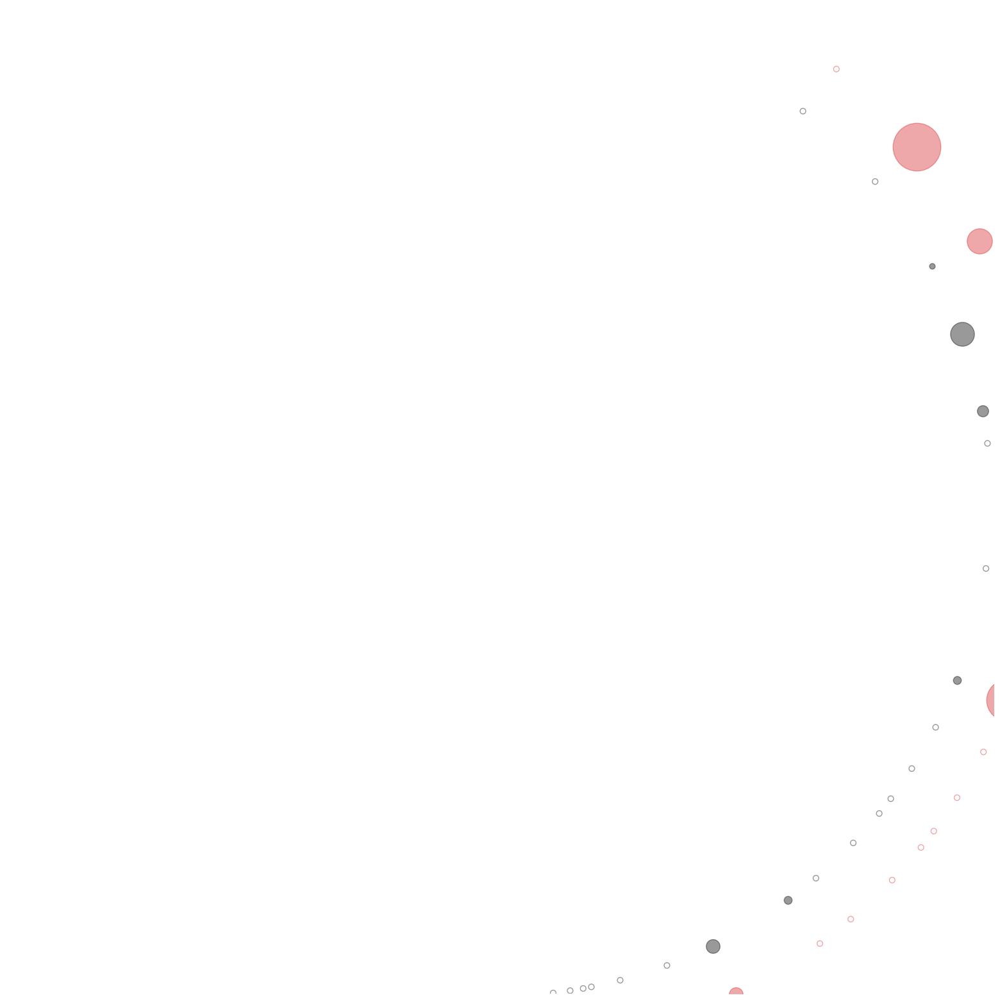

In [121]:
mapping = {'Respiratory System': 'lung', 'heart': 'heart', 'brain': 'brain', 'eye': 'eye', 'skin': 'skin', 'thoracic thymus': 'thymus', 'lymph node': 'lymph node', 
           'spleen': 'spleen', 'liver': 'liver', 'Pancreas': 'pancreas', 'Small Intestine': 'small intestine', 'large intestine': 'large intestine', 'kidney': 'kidney', 
           'urinary bladder': 'urinary bladder', 'ureter': 'ureter', 'prostate gland': 'prostate gland', 'ovary': 'ovary', 'Fallopian tube':'fallopian_tube', 
           'Uterus': 'uterus', 'Placenta': 'placenta', 'knee': 'knee', 'Bone marrow': 'bone marrow'}

plt.figure(frameon=False, figsize=(20,20))
plt.axes().set_aspect('equal')
plt.axis('off')
plt.xlim(0,1720)
plt.ylim(-1720,0)
for organ in coordinates_black.keys():
    size_scale = 40
    if organ in mapping and mapping[organ] in match_vess:
        red_diam = nomatch_vess[mapping[organ]]
        if red_diam:
            plt.scatter([coordinates_red[organ][0]], [-coordinates_red[organ][1]], s=red_diam*size_scale, c='tab:red', alpha=0.4)            
        else: 
            plt.scatter([coordinates_red[organ][0]], [-coordinates_red[organ][1]], s=1*size_scale, facecolors='none', edgecolors='tab:red', alpha=0.4) 
            
        black_diam = match_vess[mapping[organ]]
        if black_diam:
            plt.scatter([coordinates_black[organ][0]], [-coordinates_black[organ][1]], s=black_diam*size_scale, c='black', alpha=0.4)
        else:
            plt.scatter([coordinates_black[organ][0]], [-coordinates_black[organ][1]], s=1*size_scale,  facecolors='none', edgecolors='black', alpha=0.4)
        
    else:
        plt.scatter([coordinates_red[organ][0]], [-coordinates_red[organ][1]], s=1*size_scale, facecolors='none', edgecolors='tab:red', alpha=0.4)
        plt.scatter([coordinates_black[organ][0]], [-coordinates_black[organ][1]], s=1*size_scale,  facecolors='none', edgecolors='black', alpha=0.4)
    
plt.savefig(f'data/output/male_bubbles_v13.svg', bbox_inches='tight', pad_inches=0)
   
plt.show()

In [122]:
with open('data/output/vis_female_vega.json', encoding='utf8') as json_file:
    viz = json.load(json_file)

In [123]:
female_wing_viz = viz['data'][0]['values']

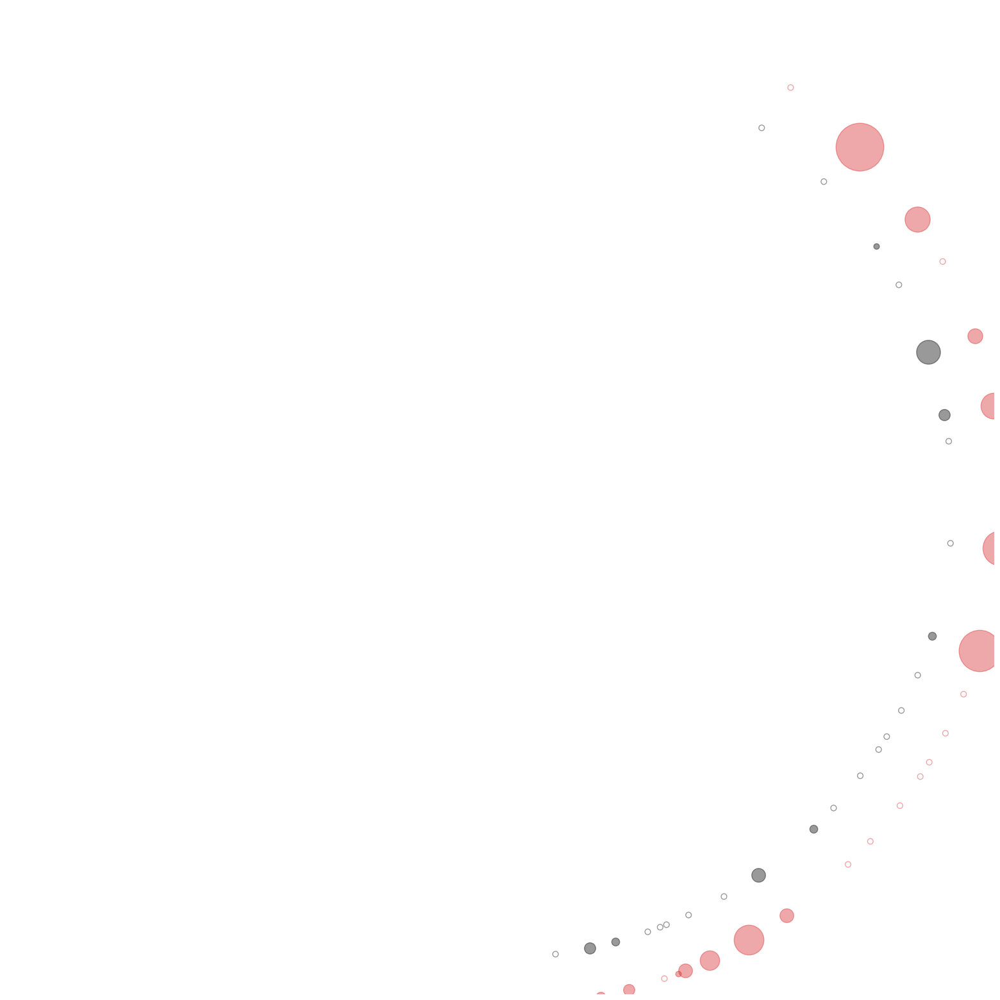

In [125]:
body_x = female_wing_viz[0]['x']
body_y = female_wing_viz[0]['y']
# print('Body original: ', body_x, body_y)
# center_x = 1720/2
# center_y = 1720/2
# print('Center:', center_x, center_y)
coordinates_black = dict()
coordinates_red = dict()
for asct in female_wing_viz:
    if asct['name'] in fem_nodes[fem_nodes['id_old']==1].name.values:
        # male_rots_for_organs[asct['name']] = -round(np.arctan((asct['x']-body_x)/(body_y-asct['y']))*180/np.pi, 3)
        coordinates_red[asct['name']] = (round(body_x-10 + 13.3*(asct['x']-body_x),2), round(body_y + 13.3*(asct['y']-body_y), 2))
        coordinates_black[asct['name']] = (round(body_x-10 + 12*(asct['x']-body_x),2), round(body_y + 12*(asct['y']-body_y), 2))

mapping = {'Respiratory System': 'lung', 'heart': 'heart', 'brain': 'brain', 'eye': 'eye', 'skin': 'skin', 'thoracic thymus': 'thymus', 'lymph node': 'lymph node', 
           'spleen': 'spleen', 'liver': 'liver', 'Pancreas': 'pancreas', 'Small Intestine': 'small intestine', 'large intestine': 'large intestine', 'kidney': 'kidney', 
           'urinary bladder': 'urinary bladder', 'ureter': 'ureter', 'prostate gland': 'prostate gland', 'ovary': 'ovary', 'Fallopian tube':'fallopian_tube', 
           'Uterus': 'uterus', 'Placenta': 'placenta', 'knee': 'knee', 'Bone marrow': 'bone marrow'}

plt.figure(frameon=False, figsize=(20,20))
plt.axes().set_aspect('equal')
plt.axis('off')
plt.xlim(0,1720)
plt.ylim(-1720,0)
for organ in coordinates_black.keys():
    size_scale = 40
    if organ in mapping and mapping[organ] in match_vess:
        red_diam = nomatch_vess[mapping[organ]]
        if red_diam:
            plt.scatter([coordinates_red[organ][0]], [-coordinates_red[organ][1]], s=red_diam*size_scale, c='tab:red', alpha=0.4)            
        else: 
            plt.scatter([coordinates_red[organ][0]], [-coordinates_red[organ][1]], s=1*size_scale, facecolors='none', edgecolors='tab:red', alpha=0.4) 
            
        black_diam = match_vess[mapping[organ]]
        if black_diam:
            plt.scatter([coordinates_black[organ][0]], [-coordinates_black[organ][1]], s=black_diam*size_scale, c='black', alpha=0.4)
        else:
            plt.scatter([coordinates_black[organ][0]], [-coordinates_black[organ][1]], s=1*size_scale,  facecolors='none', edgecolors='black', alpha=0.4)
        
    else:
        plt.scatter([coordinates_red[organ][0]], [-coordinates_red[organ][1]], s=1*size_scale, facecolors='none', edgecolors='tab:red', alpha=0.4)
        plt.scatter([coordinates_black[organ][0]], [-coordinates_black[organ][1]], s=1*size_scale,  facecolors='none', edgecolors='black', alpha=0.4)
    
plt.savefig(f'data/output/female_bubbles_v13.svg', bbox_inches='tight', pad_inches=0)
   
plt.show()

In [126]:
body_y

860

### Size legend

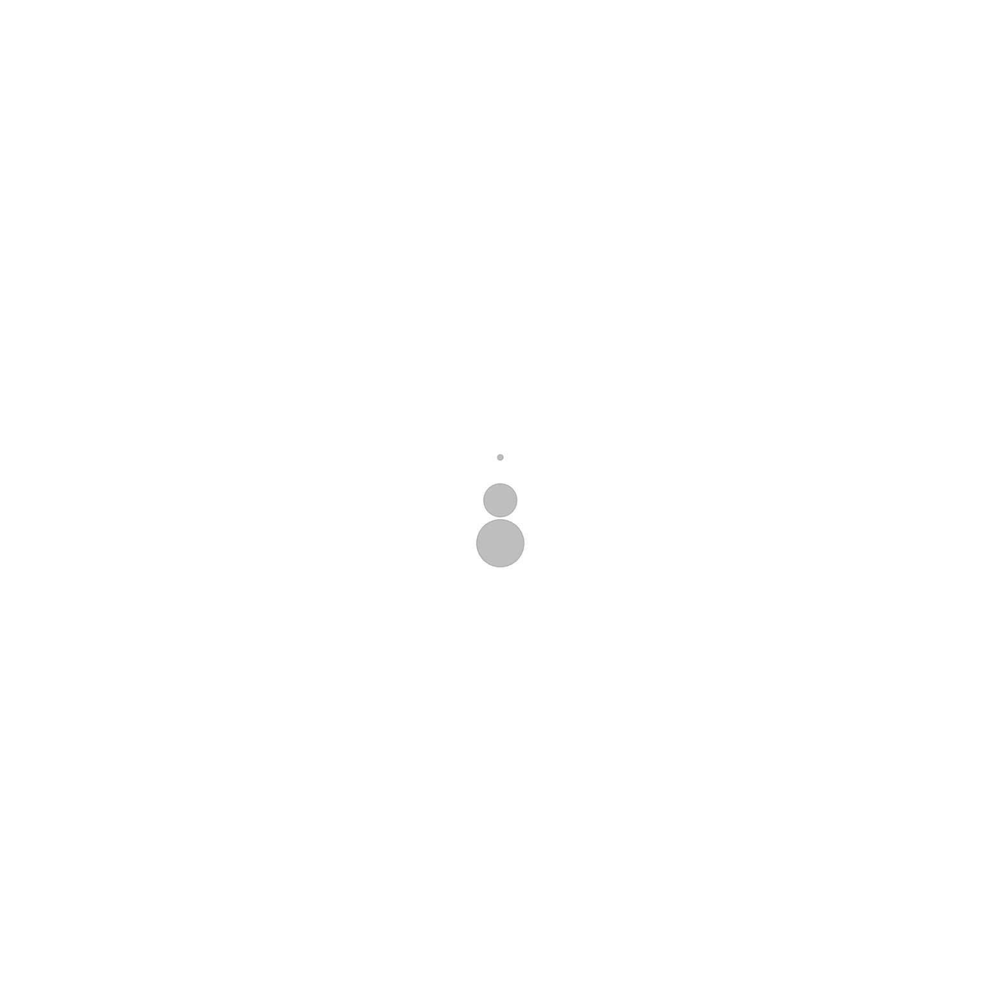

In [127]:
body_x = female_wing_viz[0]['x']
body_y = female_wing_viz[0]['y']
# print('Body original: ', body_x, body_y)
# center_x = 1720/2
# center_y = 1720/2
# print('Center:', center_x, center_y)
# sizes_black = {'one': 1, 'twntyfour': 24, 'fortyeight': 48, 'seventyone': 71}
# coordinates_black = {'one': (body_x, body_y-200), 'twntyfour': (body_x, body_y-100), 'fortyeight': (body_x, body_y), 'seventyone': (body_x, body_y+100)}
sizes_black = {'one': 1, '35': 35, 'seventyone': 71}
coordinates_black = {'one': (body_x, body_y-75), '35': (body_x, body_y), 'seventyone': (body_x, body_y+75)}

plt.figure(frameon=False, figsize=(20,20))
plt.axes().set_aspect('equal')
plt.axis('off')
plt.xlim(0,1720)
plt.ylim(-1720,0)
for organ in coordinates_black.keys():
    size_scale = 40

    plt.scatter([coordinates_black[organ][0]], [-coordinates_black[organ][1]], s=sizes_black[organ]*size_scale,alpha=0.5, c='tab:grey',)# facecolors='none', edgecolors='tab:grey')
        
    
plt.savefig(f'data/output/bubblesizelegend.svg', bbox_inches='tight', pad_inches=0)
   
plt.show()

# Vascular network 

In [128]:
matching_nodes = vasc_data[(vasc_data['is_in_organ_table']==1)&(vasc_data.BodyPart!='testis')]

In [129]:
vasc_edges = vasc_data[['BranchesFrom', 'Vessel', 'VesselType']].copy()

In [130]:
# vasc_edges = pd.read_excel('./Blood_Vasculature_v1.3_EXTENDED.xlsx', sheet_name='Vessel')[['BranchesFrom', 'Vessel', 'VesselType']]
vasc_edges

,BranchesFrom,Vessel,VesselType
0,left atrium,left atrium,heart chamber
1,left atrium,left inferior pulmonary vein,vein
2,left atrium,left superior pulmonary vein,vein
3,left atrium,pulmonary vein,vein
4,pulmonary vein,segmental pulmonary vein,vein
...,...,...,...
1025,right interlobar pulmonary artery,posterior segmental artery of right lung,artery
1026,right interlobar pulmonary artery,superior segmental artery of right lung,artery
1027,right pulmonary artery,truncus anterior of right pulmonary artery,artery
1028,truncus anterior of right pulmonary artery,anterior segmental artery of right lung,artery


In [131]:
matching_nodes

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels
0,left atrium,left atrium,UBERON:0002079,heart chamber,heart chamber,UBERON:0004151,left atrium,left atrium;left cardiac atrium;UBERON:0002079,1,0,1
1,left atrium,left inferior pulmonary vein,fma49913,vein,lung,UBERON:0002048,left atrium;left inferior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
2,left atrium,left superior pulmonary vein,fma49916,vein,lung,UBERON:0002048,left atrium;left superior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
7,left atrium,right inferior pulmonary vein,fma49911,vein,lung,UBERON:0002048,left atrium;right inferior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
8,left atrium,right superior pulmonary vein,fma49914,vein,lung,UBERON:0002048,left atrium;right superior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
9,left ventricle,left ventricle,UBERON:0002084,heart chamber,heart chamber,UBERON:0004151,left ventricle,left ventricle;heart left ventricle;UBERON:000...,1,0,1
17,common carotid artery,external carotid artery,UBERON:0001070,artery,neck,UBERON:0000974,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1
18,external carotid artery,ascending pharyngeal artery,fma49497,artery,neck,UBERON:0000974,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1
31,external carotid artery,facial artery,UBERON:0001612,artery,face,UBERON:0001456,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1
33,facial artery,ascending palatine artery,fma49555,artery,face,UBERON:0001456,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1


In [132]:
vasc_edges = vasc_edges.rename(columns={'BranchesFrom':'source', 'Vessel': 'target'})
# vasc_edges.to_excel('vasc_edgelist.xlsx')

In [133]:
#Removal of the self-loops
vasc_edges = vasc_edges[vasc_edges.source!=vasc_edges.target]

In [134]:
vasc_graph = nx.from_pandas_edgelist(vasc_edges)

In [135]:
layout_pos_full = nx.drawing.nx_agraph.graphviz_layout(vasc_graph)

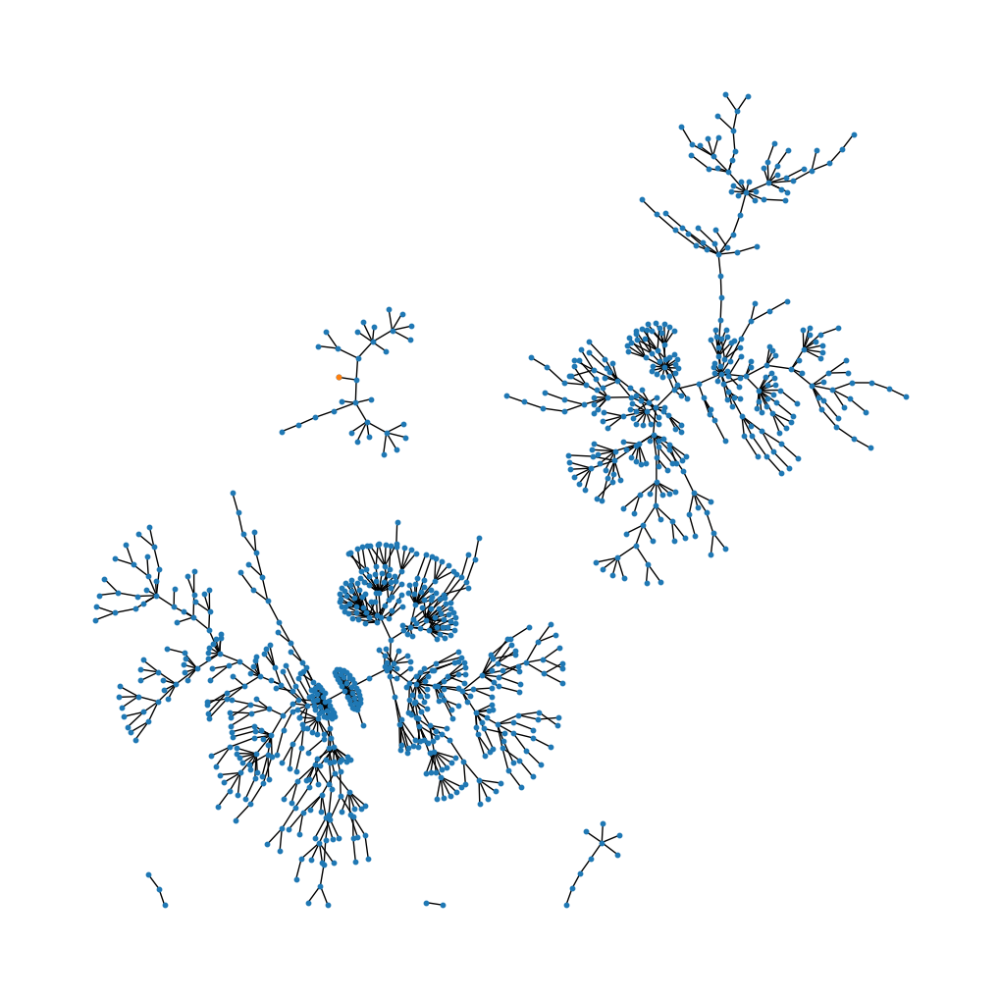

In [136]:
plt.figure(figsize=(10,10))
nx.draw(vasc_graph, pos=layout_pos_full, node_size=10)
nx.draw_networkx_nodes(vasc_graph, layout_pos_full, nodelist=['right ventricle'], node_size=10, node_color='tab:orange')
plt.show()

### Construction of the pruned graph

The graph has to be pruned at the matching nodes

We start with the layer of matching nodes, and then in each iteration, we get the parent nodes (vessels), i.e. we are moving towards the core of the network in layers. 

In [137]:
layer = vasc_edges[vasc_edges.target.isin(matching_nodes.Vessel)]
layers = [layer]
indices = list(layer.index)
while len(layer):
    layer = vasc_edges[(vasc_edges.target.isin(layer.source)) & (~vasc_edges.index.isin(indices))]
    layers += [layer]
    indices += list(layer.index)

In [138]:
pruned_vasc_edges = vasc_edges[vasc_edges.index.isin(indices)]

In [139]:
len(pruned_vasc_edges)

83

Nodes of the pruned network:

In [140]:
vasc_data[vasc_data['Vessel'].isin(set(pruned_vasc_edges[['source', 'target']].values.flatten()))]

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels
0,left atrium,left atrium,UBERON:0002079,heart chamber,heart chamber,UBERON:0004151,left atrium,left atrium;left cardiac atrium;UBERON:0002079,1,0,1
1,left atrium,left inferior pulmonary vein,fma49913,vein,lung,UBERON:0002048,left atrium;left inferior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
2,left atrium,left superior pulmonary vein,fma49916,vein,lung,UBERON:0002048,left atrium;left superior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
7,left atrium,right inferior pulmonary vein,fma49911,vein,lung,UBERON:0002048,left atrium;right inferior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
8,left atrium,right superior pulmonary vein,fma49914,vein,lung,UBERON:0002048,left atrium;right superior pulmonary vein,left atrium;left cardiac atrium;UBERON:0002079...,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...
731,hepatic portal vein,splenic vein,UBERON:0003713,vein,spleen,UBERON:0002106,right atrium;inferior vena cava;left hepatic v...,right atrium;right cardiac atrium;UBERON:00020...,1,0,1
746,splenic vein,spleen trabecular vein,UBERON:0010400,vein,spleen,UBERON:0002106,right atrium;inferior vena cava;left hepatic v...,right atrium;right cardiac atrium;UBERON:00020...,1,0,1
818,right atrium,superior vena cava,UBERON:0001585,vein,thoracic cavity,UBERON:0002224,right atrium;superior vena cava,right atrium;right cardiac atrium;UBERON:00020...,0,1,1
992,superior vena cava,left brachiocephalic vein,fma4761,vein,thoracic cavity,UBERON:0002224,right atrium;superior vena cava;left brachioce...,right atrium;right cardiac atrium;UBERON:00020...,0,1,1


In [143]:
vasc_data[vasc_data['Vessel'].isin(set(pruned_vasc_edges[['source', 'target']].values.flatten()))][['BodyPart', 'Vessel', 'ASID', 'VesselType']].to_excel('data/output/nodes_of_vascular_network_v14.xlsx')

In [145]:
pruned_vasc_edges.to_excel('data/output/vasc_edgelist_v14.xlsx')
vasc_edges.to_excel('data/output/vasc_edgelist_all_v14.xlsx')

In [146]:
pruned_vasc_graph = nx.from_pandas_edgelist(pruned_vasc_edges)

In [147]:
len(pruned_vasc_graph)

86

In [148]:
pruned_vasc_graph = nx.induced_subgraph(vasc_graph, set(pruned_vasc_graph.nodes).union(set(matching_nodes.Vessel.values)))

In [149]:
len(pruned_vasc_graph)

87

Note that the network is not connected, hence we have to add manually the 'heart' node and connect it to the components

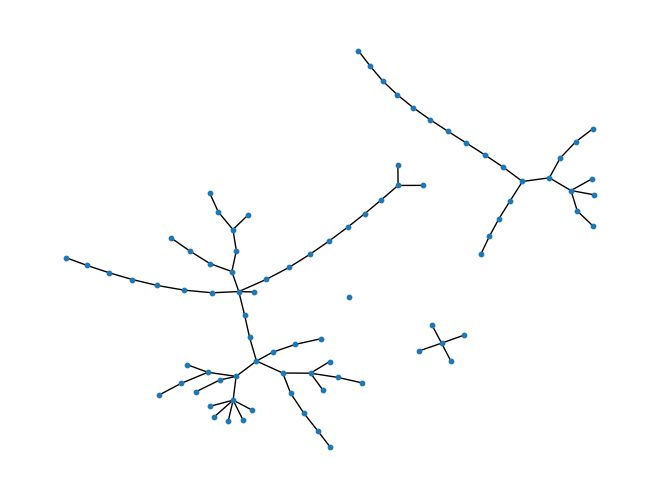

In [150]:
layout_pos = nx.drawing.nx_agraph.graphviz_layout(pruned_vasc_graph)
nx.draw(pruned_vasc_graph, pos=layout_pos, node_size=10)

### Get the coordinates from the Vega visualization 

In [171]:
with open('data/output/vis_female_vega.json', encoding='utf8') as json_file:
    viz = json.load(json_file)

In [172]:
female_viz = viz['data'][0]['values']

In [173]:
female_viz

[{'id': 0,
  'name': 'Body',
  'type': 'AS',
  'ontology_id': 'UBERON:0013702',
  'color': '#984ea0',
  'organ': 'body',
  'organ_label': '',
  'alpha': 0.5563104897839476,
  'radius': 0,
  'depth': 0,
  'children': 25,
  'angle': 14.009678365431625,
  'radians': 0.2445150146221992,
  'leftside': False,
  'x': 860,
  'y': 860},
 {'id': 1,
  'name': 'Bone marrow',
  'parent': 0,
  'type': 'AS',
  'ontology_id': 'UBERON:0002371',
  'color': '#984ea0',
  'organ': 'bone_marrow',
  'organ_label': 'Bone marrow',
  'alpha': 0.12938703685599764,
  'radius': 66.53846153846153,
  'depth': 1,
  'children': 47,
  'angle': 305.7019258969596,
  'radians': 5.335505136589664,
  'leftside': False,
  'x': 898.829750710468,
  'y': 805.9665166432125},
 {'id': 2,
  'name': 'B lineage',
  'parent': 1,
  'type': 'CT',
  'ontology_id': 'CL:0000945',
  'color': '#ff7f00',
  'organ': 'bone_marrow',
  'organ_label': '',
  'alpha': 0.1203930002932838,
  'radius': 133.07692307692307,
  'depth': 2,
  'children': 0,

Merge of heart & heart chamber, thyroid gland & lung and rename pelvis to placenta

In [174]:
matching_nodes['BodyPart'].value_counts()

BodyPart
heart            14
spleen            6
heart chamber     4
lung              4
uterus            4
kidney            4
face              3
neck              2
thymus            2
liver             2
eye               1
pelvis            1
ovary             1
Name: count, dtype: int64

In [175]:
matching_nodes[matching_nodes['BodyPart'] == 'neck']

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels,organ
17,common carotid artery,external carotid artery,UBERON:0001070,artery,neck,UBERON:0000974,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1,neck
18,external carotid artery,ascending pharyngeal artery,fma49497,artery,neck,UBERON:0000974,left ventricle;aorta;ascending aorta;aortic ar...,left ventricle;heart left ventricle;UBERON:000...,1,0,1,neck


In [176]:
organ_mapping = {'eye': 'eye', 'heart': 'heart', 
                 'heart chamber': 'heart', # heart chamber -> heart
                 'kidney': 'kidney',  'liver': 'liver', 'lung': 'lung', 'ovary': 'ovary', 
                 'pelvis': 'placenta_full_term', #pelvis -> placenta
                 'spleen': 'spleen', 'thymus': 'thymus', 
                 'thyroid gland': 'lung', #thyroid gland -> lung
                 'uterus': 'uterus', 'neck': 'neck', 'face': 'face'}

In [177]:
matching_nodes['organ'] = matching_nodes['BodyPart'].apply(lambda x: organ_mapping[x])

/var/folders/p7/kpn2wtl53w9bjt1kf0s_jfh40000gq/T/ipykernel_33388/3296384991.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matching_nodes['organ'] = matching_nodes['BodyPart'].apply(lambda x: organ_mapping[x])


Get the coordinates for the vessels

## Full graph

In [178]:
matching_nodes['ASID'].apply(transform_id).values

array(['uberon0002079', 'fma49913', 'fma49916', 'fma49911', 'fma49914',
       'uberon0002084', 'uberon0001070', 'fma49497', 'uberon0001612',
       'fma49555', 'uberon0001610', 'uberon0005336', 'uberon0001194',
       'uberon0010399', 'uberon0010401', 'uberon0013132', 'fma70195',
       'uberon0001310', 'uberon0002493', 'uberon0015173', 'uberon0001190',
       'uberon0004639', 'uberon0004640', 'uberon0005272', 'uberon0004726',
       'uberon0018243', 'fma3862', 'fma3860', 'uberon0035422',
       'uberon0001625', 'fma3851', 'fma15736', 'fma3840', 'fma3818',
       'fma3823', 'uberon0002078', 'uberon0005438', 'uberon0006958',
       'fma4708', 'uberon0009687', 'uberon0035374', 'uberon0008889',
       'uberon0006841', 'uberon0001281', 'uberon0003713', 'uberon0010400',
       'uberon0001591', 'uberon0002080'], dtype=object)

In [179]:
def get_coordinates_4_vessels(visualization, graph=pruned_vasc_graph):
    name = []
    name_in_vasc = []
    coords=[]
    organs = []
    for node in visualization:
        if transform_id(node['ontology_id']) in matching_nodes['ASID'].apply(transform_id).values: #if the node is in the vascular data 
            # if node['organ']==matching_nodes[matching_nodes['ASID'].apply(transform_id)==transform_id(node['ontology_id'])]['organ'].values[0]: # and if the organs match
            name += [node['name']]
            name_in_vasc += [matching_nodes[matching_nodes['ASID'].apply(transform_id)==transform_id(node['ontology_id'])]['Vessel'].values[0]]
            coords += [np.array([node['x'], -node['y']])]
            organs += [node['organ']]

    for node in graph:
        if node not in name_in_vasc:
            name += [node]
            name_in_vasc += [node]
            coords += [np.nan]
            organs += [np.nan]

    art_data = pd.DataFrame.from_dict({'name': name, 'name_in_vasc': name_in_vasc,
                                       'organ': organs, 'coords': coords})
    
    art_data = art_data.drop_duplicates(subset=['name_in_vasc', 'organ']).reset_index(drop=True) 
    
    art_data = art_data[art_data.name_in_vasc.isin(graph.nodes())]
    
    return art_data

In [180]:
matching_nodes.to_excel('matching_nodes_v16.xlsx')

In [181]:
coords = get_coordinates_4_vessels(female_viz)

In [182]:
coords

,name,name_in_vasc,organ,coords
0,Choriocapillaris,capillary layer of choroid,eye,"[1131.833540298991, -668.1909857015318]"
1,right atrium,right atrium,heart,"[982.105217435013, -807.0870211501043]"
2,sinoatrial nodal artery,sinoatrial nodal artery,heart,"[1041.6303321985274, -777.1946607965374]"
3,left circumflex artery,left circumflex artery,heart,"[1045.154454608299, -785.4069057227731]"
4,atrioventicular nodal artery,atrioventicular nodal artery,heart,"[1045.4785110220491, -786.2163722483674]"
...,...,...,...,...
82,external iliac artery,external iliac artery,NaN,NaN
83,internal thoracic artery,internal thoracic artery,NaN,NaN
84,short posterior ciliary artery,short posterior ciliary artery,NaN,NaN
85,hepatic portal vein,hepatic portal vein,NaN,NaN


In [183]:
len(matching_nodes)

48

In [184]:
len(coords.dropna())

48

In [185]:
nodes_wo_coords = [node for node in coords[coords['coords'].isna()]['name_in_vasc'].values if node in matching_nodes['Vessel'].values ]
nodes_wo_coords

[]

In [186]:
matching_nodes[matching_nodes['Vessel'].isin(nodes_wo_coords)]

,BranchesFrom,Vessel,ASID,VesselType,BodyPart,BodyPartID,PathFromHeart,PathFromHeartWithIDs,is_in_organ_table,not_in_organ_table,#vessels,organ


In [187]:
nodes[nodes['ontology_id'].apply(transform_id).isin(matching_nodes[matching_nodes['Vessel'].isin(nodes_wo_coords)]['ASID'].apply(transform_id).values)]

,id,id_old,name,type,organ,ontology_id,parent,color


In [188]:
relabel_mapping = coords['name_in_vasc'].to_dict()
relabel_mapping = {v: k for k, v in relabel_mapping.items()}

In [189]:
renamed_pruned_vasc = nx.relabel_nodes(pruned_vasc_graph, relabel_mapping)

In [190]:
pos = coords['coords'].dropna().to_dict()

In [191]:
pos2 = nx.spring_layout(renamed_pruned_vasc, pos=pos, fixed=list(pos.keys()), iterations=1000)

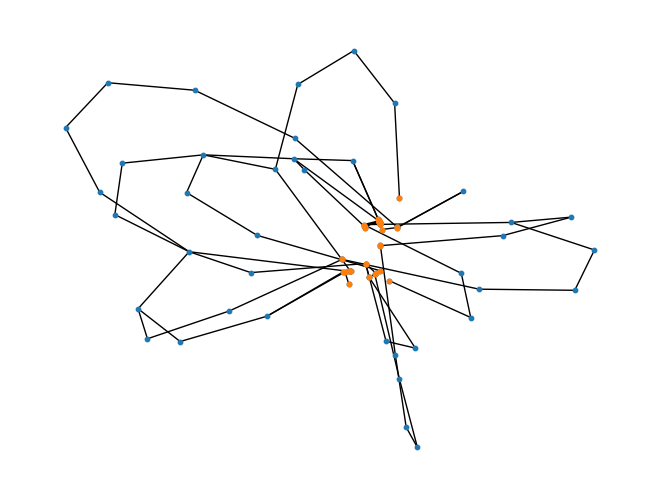

In [192]:
nx.draw(renamed_pruned_vasc, pos2, node_size=10)
nx.draw_networkx_nodes(renamed_pruned_vasc, pos2, nodelist=list(pos.keys()), node_color='tab:orange', node_size=10)
# plt.savefig('small_network.png', dpi=300)
plt.show()

In [193]:
connected_comps = [pruned_vasc_graph.subgraph(c).copy() for c in nx.connected_components(pruned_vasc_graph)]

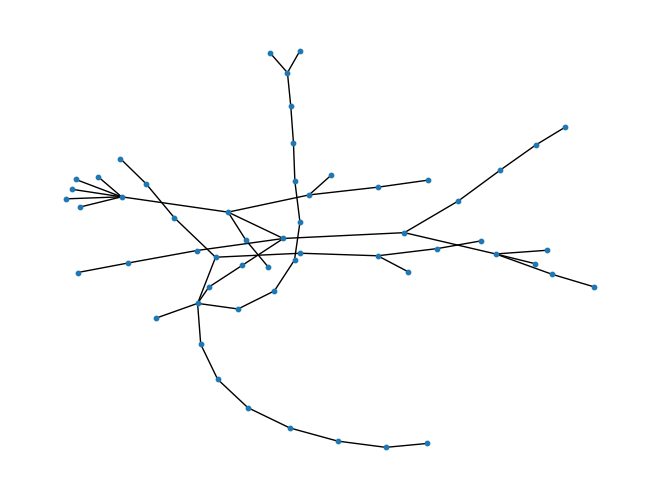

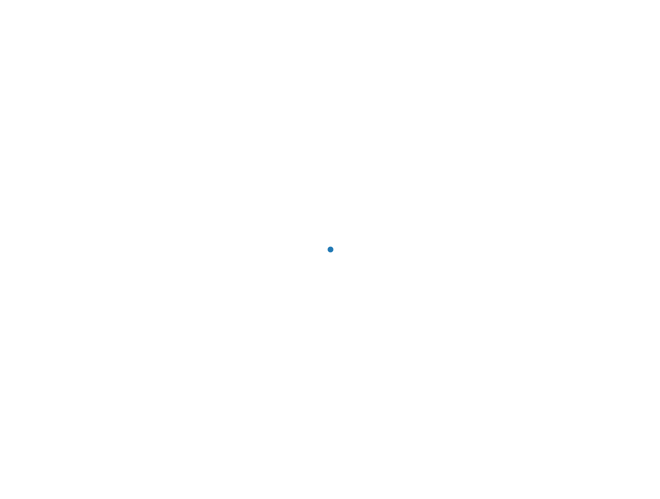

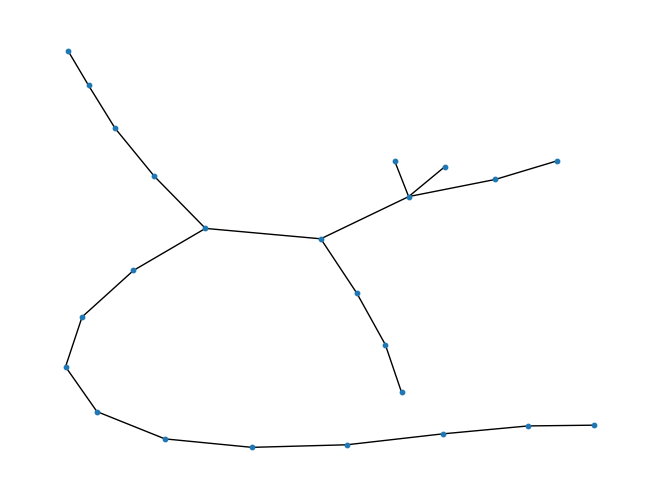

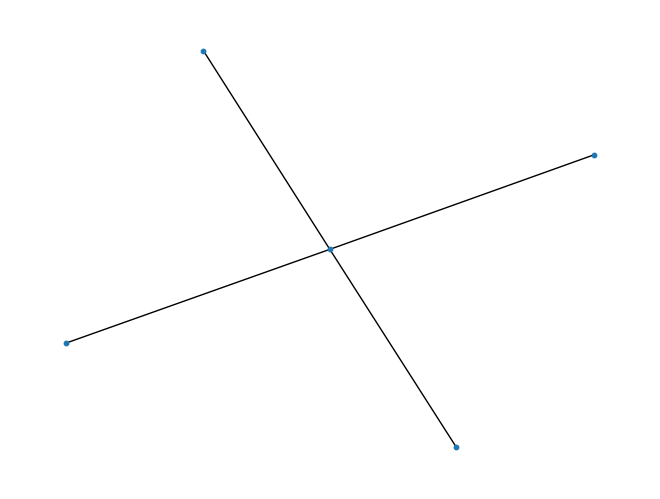

In [194]:
for comp in connected_comps:
    nx.draw(comp, node_size=10)
    plt.show()

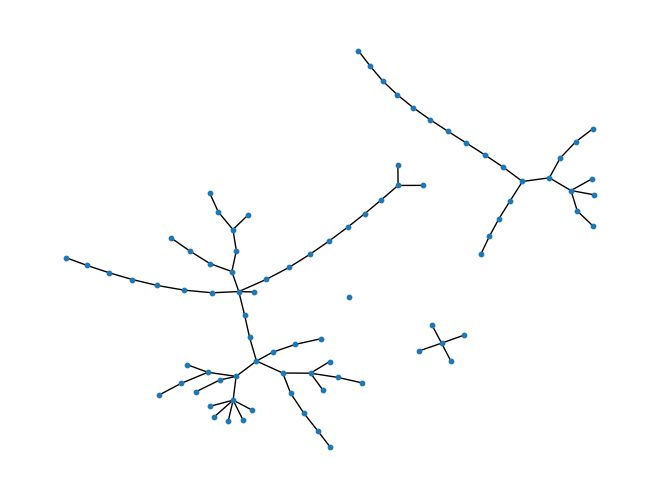

In [195]:
nx.draw(pruned_vasc_graph, pos=layout_pos, node_size=10)
plt.show()

In [196]:
leaves_of_pruned = [node for node in pruned_vasc_graph if nx.degree(pruned_vasc_graph, node)<=1]

In [197]:
len(leaves_of_pruned)

31

In [198]:
matching_not_leaf = [node for node in matching_nodes.Vessel.values if node not in leaves_of_pruned]

In [199]:
matching_leaf = [node for node in matching_nodes.Vessel.values if node in leaves_of_pruned]

In [200]:
len(matching_not_leaf)+len(matching_leaf)

48

In [201]:
len(matching_nodes)

48

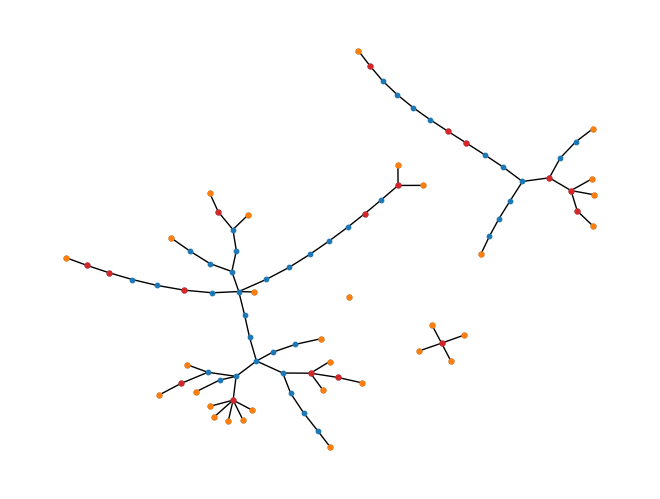

In [202]:
nx.draw(pruned_vasc_graph, pos=layout_pos, node_size=10)
nx.draw_networkx_nodes(pruned_vasc_graph, layout_pos,
                       nodelist=matching_not_leaf, 
                       node_color='tab:red', node_size=12)
nx.draw_networkx_nodes(pruned_vasc_graph, layout_pos,
                       nodelist=matching_leaf, 
                       node_color='tab:orange', node_size=12)
plt.show()

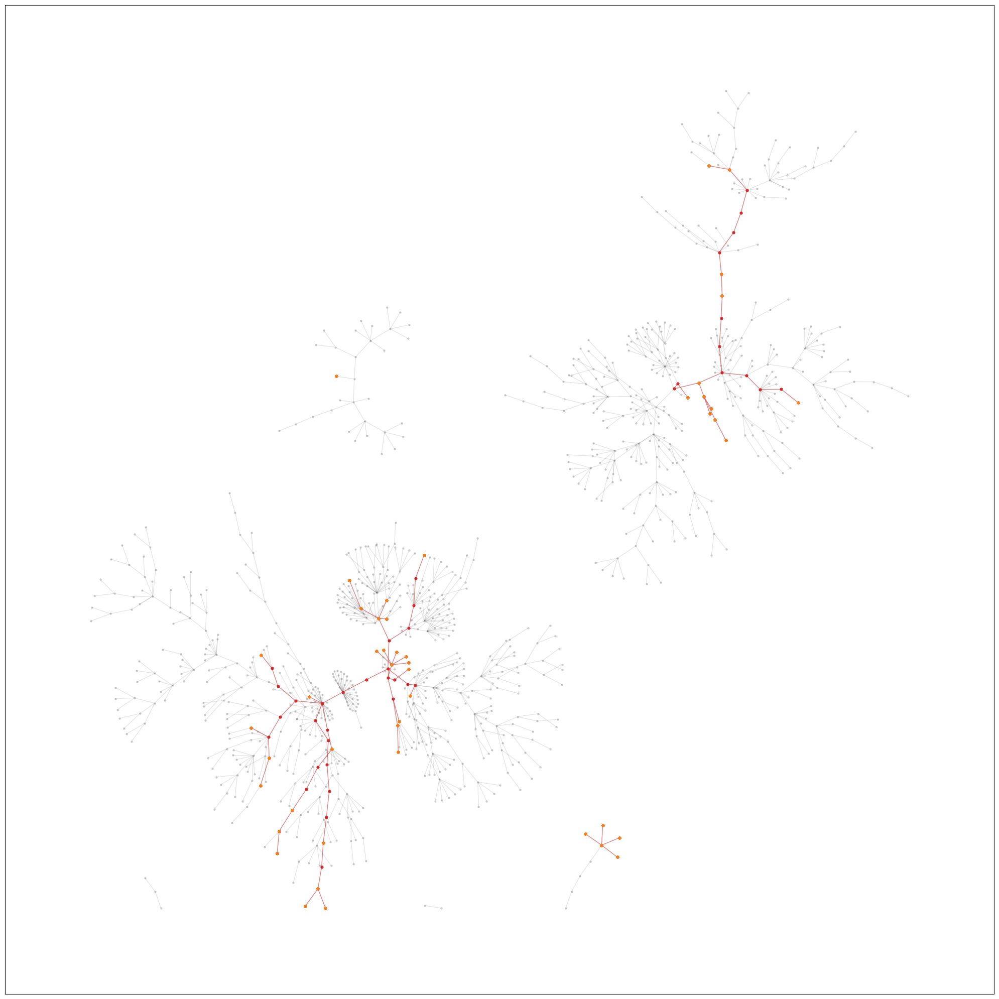

In [203]:
plt.figure(figsize=(20,20))
nx.draw_networkx_nodes(vasc_graph, pos=layout_pos_full, node_size=5, node_color='tab:grey', alpha=0.3)
nx.draw_networkx_edges(vasc_graph, pos=layout_pos_full, alpha=0.1)
nx.draw_networkx_edges(pruned_vasc_graph, pos=layout_pos_full, alpha=0.5, edge_color='tab:red')
nx.draw_networkx_nodes(pruned_vasc_graph, layout_pos_full,
                       nodelist=pruned_vasc_graph.nodes, 
                       node_color='tab:red', node_size=12)
nx.draw_networkx_nodes(pruned_vasc_graph, layout_pos_full,
                       nodelist=matching_not_leaf, 
                       node_color='tab:orange', node_size=12)
nx.draw_networkx_nodes(pruned_vasc_graph, layout_pos_full,
                       nodelist=matching_leaf, 
                       node_color='tab:orange', node_size=12)
plt.tight_layout()
plt.savefig('vascular_v14.png', dpi=300)
plt.show()

# Connect the components of the vascular network 

In [205]:
# Load json files 
json_data_asctb_blood = {}
for filename in listdir('data/v16/'):
    if '.json' in filename:
        # print(filename)
        with open(f'data/v16/{filename}', encoding='utf8') as json_file:
            data = json.load(json_file)

        json_data_asctb_blood[filename[:-5]] = data

In [206]:
json_data_asctb_blood.keys()

dict_keys(['blood', 'placenta_full_term', 'spleen', 'large_intestine', 'lymph_vasculature', 'brain', 'lymph_nodes', 'palatine_tonsil', 'blood_vasculature', 'thymus', 'ovary', 'main_bronchus', 'uterus', 'spinal_cord', 'urinary_bladder', 'bone_marrow', 'skin', 'kidney', 'liver', 'pancreas', 'lung', 'skeleton', 'heart', 'peripheral_nervous_system', 'eye', 'trachea', 'fallopian_tube', 'small_intestine', 'knee', 'muscular_system', 'ureter', 'prostate'])

In [207]:
nodes, edges = combine_data(json_data_asctb_blood, remove_ctct=True, combine=False, blood=True)

[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702]
blood is tree: True
_____________
[    id  id_old  name type organ     ontology_id
id                                             
0    0       0  Body   AS  body  UBERON:0013702,     id  id_old                               name type  organ     ontology_id
id                                                                           
0    0       0                               Body   AS   body  UBERON:0013702
1    1       1                              Blood   AS  blood  UBERON:0000178
2    2       2                          B lineage   CT  blood      CL:0000945
3    3       3                    immature B cell   CT  blood      CL:0000816
4    4       4                      memory B cell   CT  blood      CL:0000787
5    5       5                       naive B cell   CT  blood      CL:0000788
6    6       6                transitional B cell 

In [208]:
blood_vasc_nodes = nodes['blood_vasculature']

In [209]:
blood_vasc_edges = edges['blood_vasculature']

In [210]:
blood_vasc_nodes

,id,id_old,name,type,organ,ontology_id
id,,,,,,
0,0,0,Body,AS,body,UBERON:0013702
1,1,1,blood vasculature,AS,blood_vasculature,UBERON:0004537
2,2,2,left atrium,AS,blood_vasculature,UBERON:0002079
3,3,3,left inferior pulmonary vein,AS,blood_vasculature,FMA:49913
4,4,4,left superior pulmonary vein,AS,blood_vasculature,FMA:49916
...,...,...,...,...,...,...
4472,4472,1091,endothelial cell of arteriole,CT,blood_vasculature,CL:1000412
4473,4473,1091,endothelial cell of arteriole,CT,blood_vasculature,CL:1000412
4474,4474,1091,endothelial cell of arteriole,CT,blood_vasculature,CL:1000412


In [219]:
blood_vasc_edges

,source,target
0,1,2
1,1,14
2,1,668
3,1,1045
4,1,0
...,...,...
4471,1081,4455
4472,1082,2144
4473,1082,3158
4474,1082,3807


In [211]:
blood_vasc_graph = nx.from_pandas_edgelist(blood_vasc_edges)

In [218]:
blood_vasc_graph

In [216]:
blood_vasc_graph = nx.relabel_nodes(blood_vasc_graph, blood_vasc_nodes['name'].to_dict())

In [217]:
blood_vasc_graph

Root node exists in the graph.
Positions: {'blood vasculature': array([-0.20536296, -0.74175125]), 'left atrium': array([-0.23606518, -0.53834182]), 'left ventricle': array([-0.08156633, -0.58354068]), 'right atrium': array([-0.27836537, -0.5333364 ]), 'right ventricle': array([-0.06306295, -0.58440423]), 'Body': array([-0.25961766, -1.        ]), 'left inferior pulmonary vein': array([-0.22540727, -0.34985963]), 'left superior pulmonary vein': array([-0.19501923, -0.34493896]), 'pulmonary vein': array([-0.1813245 , -0.34290287]), 'right inferior pulmonary vein': array([-0.21274492, -0.3493458 ]), 'right superior pulmonary vein': array([-0.23814343, -0.34541249]), 'cardiac endothelial cell': array([-0.19808777, -0.69847894]), 'blood vessel endothelial cell': array([-0.01442649, -0.00307142]), 'endothelial cell of vein': array([-0.27758303, -0.09425166]), 'intersegmental pulmonary vein': array([-0.15809405, -0.26510888]), 'subsegmental pulmonary vein': array([-0.18031931, -0.18614645]),

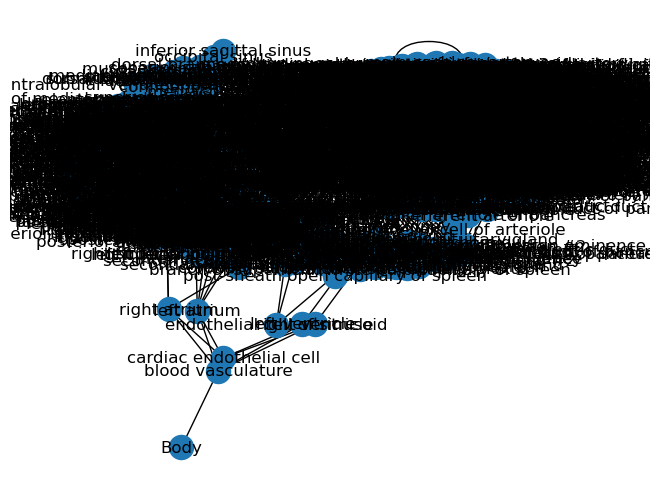

In [251]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Assuming blood_vasc_nodes and blood_vasc_edges are DataFrames
# Create the graph from the edges
blood_vasc_graph = nx.from_pandas_edgelist(blood_vasc_edges, source='source', target='target')

# Relabel nodes using the 'name' column in blood_vasc_nodes DataFrame
node_mapping = blood_vasc_nodes.set_index('id')['name'].to_dict()
blood_vasc_graph = nx.relabel_nodes(blood_vasc_graph, node_mapping)

# Check if the root node exists
if 'blood vasculature' in blood_vasc_graph.nodes:
    print("Root node exists in the graph.")
else:
    print("Root node does not exist in the graph. Available nodes are:", blood_vasc_graph.nodes)

# Use an alternative layout method (spring_layout)
pos = nx.spring_layout(blood_vasc_graph)

# Print positions to debug
print("Positions:", pos)

# Check if 'blood vasculature' has a position
if 'blood vasculature' in pos:
    print(f"Position of 'blood vasculature': {pos['blood vasculature']}")
else:
    print("Position for 'blood vasculature' not found.")

# Draw the graph using the alternative layout
try:
    nx.draw(blood_vasc_graph, pos, with_labels=True)
    plt.show()
except nx.NetworkXError as e:
    print(f"NetworkXError: {e}")


In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Assuming blood_vasc_nodes and blood_vasc_edges are DataFrames
# Create the graph from the edges
blood_vasc_graph = nx.from_pandas_edgelist(blood_vasc_edges, source='source', target='target')

# Relabel nodes using the 'name' column in blood_vasc_nodes DataFrame
node_mapping = blood_vasc_nodes.set_index('id')['name'].to_dict()
blood_vasc_graph = nx.relabel_nodes(blood_vasc_graph, node_mapping)

# Check if the root node exists
if 'blood vasculature' in blood_vasc_graph.nodes:
    print("Root node exists in the graph.")
else:
    print("Root node does not exist in the graph. Available nodes are:", blood_vasc_graph.nodes)

# Create the position layout
try:
    pos = nx.drawing.nx_pydot.graphviz_layout(blood_vasc_graph, prog='dot', root='blood vasculature')
    print("Layout created successfully.")
    print("Positions:", pos)
    
    # Check if 'blood vasculature' has a position
    if 'blood vasculature' in pos:
        print(f"Position of 'blood vasculature': {pos['blood vasculature']}")
    else:
        print("Position for 'blood vasculature' not found.")
except (IndexError, KeyError) as e:
    print(f"An error occurred with graphviz_layout: {e}")
    print("Falling back to spring layout.")
    pos = nx.spring_layout(blood_vasc_graph)

# Draw the graph
try:
    nx.draw(blood_vasc_graph, pos, with_labels=True)
    plt.show()
except nx.NetworkXError as e:
    print(f"NetworkXError: {e}")


Root node exists in the graph.
An error occurred with graphviz_layout: list index out of range
Falling back to spring layout.


In [254]:
pos = nx.drawing.nx_pydot.graphviz_layout(G=blood_vasc_graph, root='blood vasculature')

IndexError: list index out of range

In [227]:
[node for node in pruned_vasc_graph if node not in blood_vasc_graph]

['lateral inferior segmental branch of left hepatic portal vein',
 'liver sinusoid',
 'segmental branch of hepatic vein',
 'hepatic portal vein',
 'penicillar arteriole']

In [228]:
subgraph = nx.induced_subgraph(blood_vasc_graph, list(pruned_vasc_graph.nodes)+['blood vasculature'])

In [229]:
pos = nx.drawing.nx_pydot.graphviz_layout(subgraph, root='blood vasculature')

IndexError: list index out of range

In [230]:
pos_of_pruned = nx.spring_layout(pruned_vasc_graph, pos=pos, fixed=pos.keys(), iterations=1000, dim=2, k=0.01/np.sqrt(len(pruned_vasc_graph)))

IndexError: arrays used as indices must be of integer (or boolean) type

In [231]:
connected_comps = [pruned_vasc_graph.subgraph(c).copy() for c in nx.connected_components(pruned_vasc_graph)]

In [232]:
new_edges = [edge for edge in subgraph.edges if edge not in pruned_vasc_graph.edges]

In [233]:
connected_comps[3].nodes

NodeView(('right inferior pulmonary vein', 'left superior pulmonary vein', 'right superior pulmonary vein', 'left atrium', 'left inferior pulmonary vein'))

NetworkXError: Node 'common iliac artery' has no position.

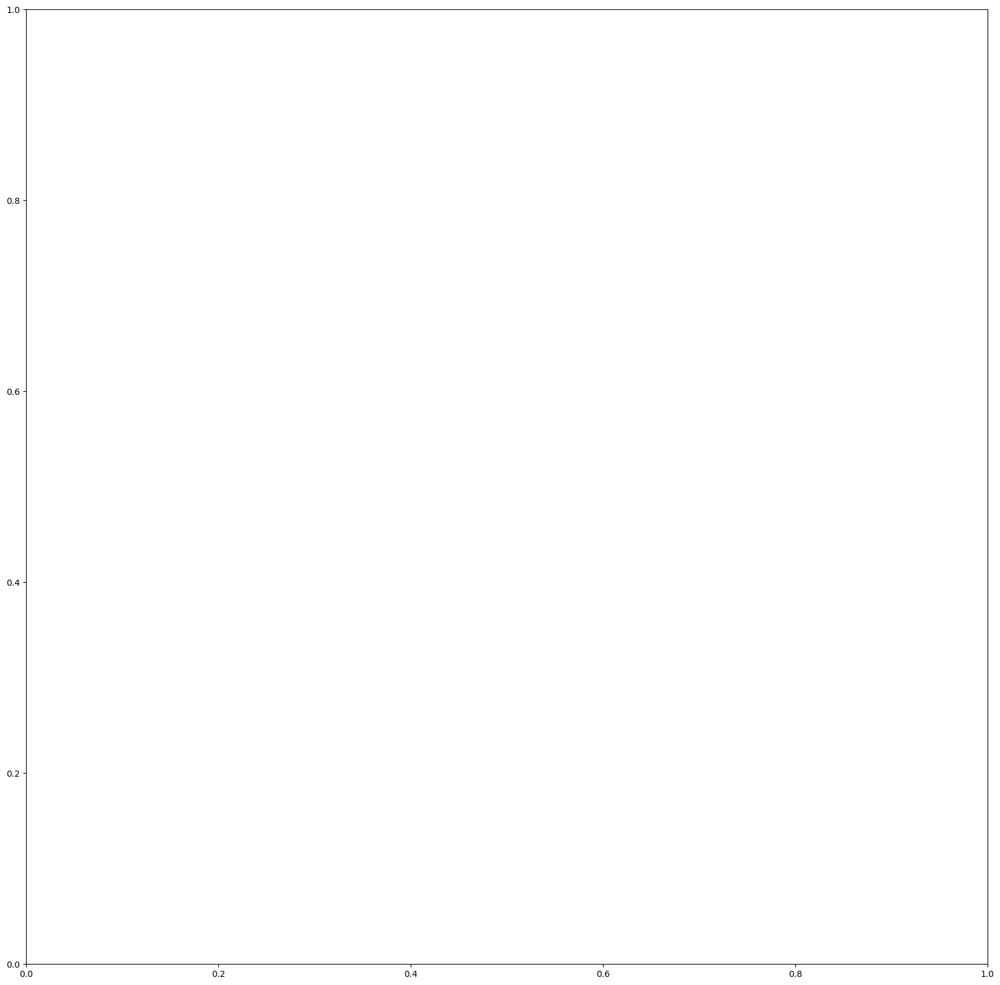

In [234]:
plt.figure(figsize=(20,20))
nx.draw_networkx_nodes(subgraph, pos=pos, node_size=5, node_color='tab:grey', alpha=0.3)
nx.draw_networkx_labels(subgraph, pos=pos, font_size=8)
nx.draw_networkx_edges(subgraph, pos=pos, edgelist=new_edges, alpha=0.9)

colors = ['tab:red', 'tab:blue', 'tab:blue', 'tab:red']
for idx, comp in enumerate(connected_comps):
    nx.draw_networkx_edges(comp, pos=pos_of_pruned, alpha=0.3, edge_color=colors[idx])

plt.tight_layout()
plt.savefig('completed_vascular_v14.png', dpi=350)
plt.show()

In [235]:
new_edges

[('right ventricle', 'blood vasculature'),
 ('left ventricle', 'blood vasculature'),
 ('left atrium', 'blood vasculature'),
 ('right atrium', 'blood vasculature')]

In [236]:
[edge for edge in pruned_vasc_graph.edges if edge[0] in ['hepatic portal vein']]

[('hepatic portal vein', 'left hepatic portal vein')]

### add edges

In [237]:
pruned_vasc_graph_comp = pruned_vasc_graph.copy()

In [238]:
pruned_vasc_graph_comp.add_edges_from([('blood vasculature', 'left atrium'),('blood vasculature', 'left ventricle'),
                                       ('blood vasculature', 'right atrium'), ('blood vasculature', 'right ventricle')])

In [239]:
connected_comps[2].nodes

NodeView(('great cardiac vein', 'left hepatic vein', 'superior vena cava', 'thymic vein', 'spleen trabecular vein', 'small cardiac vein', 'hepatic portal venule', 'inferior vena cava', 'left brachiocephalic vein', 'segmental branch of hepatic vein', 'left marginal vein', 'common iliac vein', 'lateral inferior segmental branch of left hepatic portal vein', 'right atrium', 'splenic vein', 'uterine vein', 'hepatic portal vein', 'internal iliac vein', 'liver sinusoid', 'uterine venous plexus', 'coronary sinus', 'left hepatic portal vein', 'central vein of liver', 'middle cardiac vein'))

In [240]:
veins = [node for node in pruned_vasc_graph_comp if (node not in connected_comps[0]) and (node not in connected_comps[3])]

In [241]:
veins

['right ventricle',
 'left hepatic vein',
 'spleen trabecular vein',
 'inferior vena cava',
 'left marginal vein',
 'internal iliac vein',
 'central vein of liver',
 'uterine vein',
 'uterine venous plexus',
 'coronary sinus',
 'great cardiac vein',
 'superior vena cava',
 'small cardiac vein',
 'lateral inferior segmental branch of left hepatic portal vein',
 'right atrium',
 'liver sinusoid',
 'thymic vein',
 'hepatic portal venule',
 'left brachiocephalic vein',
 'segmental branch of hepatic vein',
 'common iliac vein',
 'splenic vein',
 'hepatic portal vein',
 'left hepatic portal vein',
 'middle cardiac vein',
 'blood vasculature']

In [242]:
arteries = [node for node in pruned_vasc_graph_comp if (node not in connected_comps[1]) and (node not in connected_comps[2])]

In [243]:
arteries

['common iliac artery',
 'left ventricle',
 'diagonal branch of left anterior descending artery',
 'left anterior descending artery',
 'internal carotid artery',
 'arcuate renal artery',
 'ascending pharyngeal artery',
 'segmental branch of lobar artery of spleen',
 'right inferior pulmonary vein',
 'ascending aorta',
 'common carotid artery',
 'spleen trabecular artery',
 'splenic artery',
 'peritubular capillary',
 'segmental renal artery',
 'external carotid artery',
 'inferior epigastric artery',
 'thymic artery',
 'spleen central arteriole',
 'internal iliac artery',
 'left atrium',
 'vasa recta of kidney',
 'uterine artery',
 'left circumflex artery',
 'left coronary artery',
 'descending aorta',
 'interlobar renal artery',
 'glomerular capillary',
 'facial artery',
 'right superior pulmonary vein',
 'sinoatrial nodal artery',
 'renal afferent arteriole',
 'left superior pulmonary vein',
 'interlobular renal artery',
 'celiac artery',
 'ophthalmic artery',
 'aortic arch',
 'lobar

In [244]:
pos = nx.drawing.nx_pydot.graphviz_layout(pruned_vasc_graph_comp, root='blood vasculature')

IndexError: list index out of range

NetworkXError: Node 'common iliac artery' has no position.

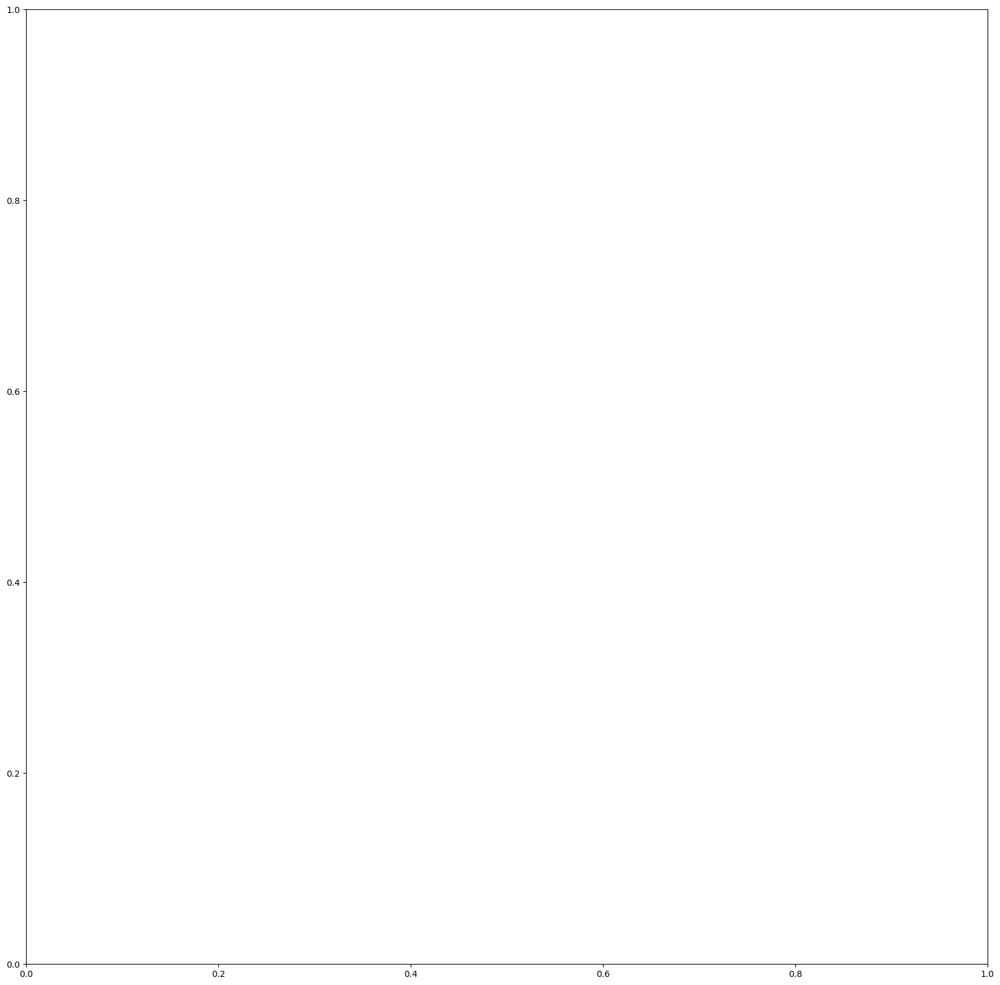

In [245]:
plt.figure(figsize=(20,20))
nx.draw_networkx_nodes(pruned_vasc_graph_comp, pos=pos, node_size=5, node_color='tab:grey', alpha=0.3)
nx.draw_networkx_labels(pruned_vasc_graph_comp, pos=pos, font_size=8)
# nx.draw_networkx_edges(subgraph, pos=pos, edgelist=new_edges, alpha=0.9)

nx.draw_networkx_edges(nx.induced_subgraph(pruned_vasc_graph_comp, veins), pos=pos, alpha=0.5, edge_color='tab:blue')
nx.draw_networkx_edges(nx.induced_subgraph(pruned_vasc_graph_comp, arteries), pos=pos, alpha=0.5, edge_color='tab:red')

plt.tight_layout()
plt.savefig('completed_vascular_v14.png', dpi=350)
plt.show()

# Female and male vascular network 

In [ ]:
vasc_data.BodyPart.unique()

In [ ]:
female_vessels = vasc_data[vasc_data.BodyPart.isin(['clitoris', 'ovary', 'uterus', 'vagina'])] 

In [ ]:
male_vessels = vasc_data[vasc_data.BodyPart.isin(['penis', 'scrotum', 'testis'])]

In [ ]:
pruned_vasc_graph_comp_male = nx.induced_subgraph(pruned_vasc_graph_comp, [node for node in pruned_vasc_graph_comp if node not in female_vessels.Vessel.values])

In [ ]:
pruned_vasc_graph_comp_female = nx.induced_subgraph(pruned_vasc_graph_comp, [node for node in pruned_vasc_graph_comp if node not in male_vessels.Vessel.values])

In [ ]:
nx.write_gml(pruned_vasc_graph_comp_female, './viz_v14/pruned_vasc_graph_comp_female.gml')

In [ ]:
nx.write_gml(pruned_vasc_graph_comp_male, './viz_v14/pruned_vasc_graph_comp_male.gml')

In [ ]:
readojfwfoj=nx.read_gml('./viz_v14/pruned_vasc_graph_comp_male.gml')

In [ ]:
set(list(readojfwfoj.edges()))==set(list(pruned_vasc_graph_comp_male.edges()))

In [ ]:
pruned_vasc_graph_comp_female.number_of_edges()

In [ ]:
len(pruned_vasc_graph_comp_male)

In [ ]:
len(pruned_vasc_graph_comp_female)

In [ ]:
len(pruned_vasc_graph_comp)

## Unfortunately, this does not work well for the matplotlib inline backend in Jupyter because that backend uses a different default of rcParams['figure.dpi'] = 72. Additionally, it saves the figure with bbox_inches='tight', which crops the figure and makes the actual size unpredictable.

https://matplotlib.org/stable/gallery/subplots_axes_and_figures/figure_size_units.html

# So it is not recommended to run in Jupyter but it works fine in PyCharm / DataSpell

In [220]:
def plot_fixed_graph2(graph, viz, bundle_edges=False, draw_labels=False, filename='vasculature'):
    graphs = {'veins': nx.induced_subgraph(graph, veins), 'arteries': nx.induced_subgraph(graph, arteries)}
    coords = {'veins': get_coordinates_4_vessels(viz, graphs['veins']), 'arteries': get_coordinates_4_vessels(viz, graphs['arteries'])}
    relabel_mapping_inv = {'veins': coords['veins']['name_in_vasc'].to_dict(), 'arteries': coords['arteries']['name_in_vasc'].to_dict()}
    relabel_mapping =  {'veins': {v: k for k, v in relabel_mapping_inv['veins'].items()}, 'arteries':{v: k for k, v in relabel_mapping_inv['arteries'].items()}}
    # {'veins': , 'arteries': }
    renamed_comp = {'veins': nx.relabel_nodes(graphs['veins'], relabel_mapping['veins']), 'arteries': nx.relabel_nodes(graphs['arteries'], relabel_mapping['arteries']) } 
    
    pos = {'veins': coords['veins']['coords'].dropna().to_dict(), 'arteries': coords['arteries']['coords'].dropna().to_dict()}
    pos['veins'][relabel_mapping['veins']['blood vasculature']] = np.array([body_x-10, -body_y])
    pos['arteries'][relabel_mapping['arteries']['blood vasculature']] = np.array([body_x-10, -body_y])
    pos2 = {'veins': nx.spring_layout(renamed_comp['veins'], pos=pos['veins'], fixed=list(pos['veins'].keys()), seed=10, iterations=1000, dim=2, k=0.01/np.sqrt(len(graphs['veins']))), 
            'arteries': nx.spring_layout(renamed_comp['arteries'], pos=pos['arteries'], fixed=list(pos['arteries'].keys()), seed=10, iterations=1000, dim=2, k=0.01/np.sqrt(len(graphs['arteries'])))}
    
    if not bundle_edges:
        plt.figure(figsize=(17.2,17.2))
        plt.axes().set_aspect('equal')
        plt.margins(x=0, y=0)
        plt.xlim(0,1720)
        plt.ylim(-1720, 0)
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0, hspace=0, wspace=0)
        plt.tight_layout(pad=0, h_pad=0, w_pad=0, rect=(0,0,1,1))
        plt.axis('off') 
        nx.draw(renamed_comp['veins'], pos2['veins'], node_size=10, edge_color='tab:blue', node_color='tab:blue')
        nx.draw(renamed_comp['arteries'], pos2['arteries'], node_size=10, edge_color='tab:red', node_color='tab:red')
        if draw_labels:
            nx.draw_networkx_labels(renamed_comp['veins'], pos2['veins'], labels=relabel_mapping_inv['veins'], font_size=3)
            nx.draw_networkx_labels(renamed_comp['arteries'], pos2['arteries'], labels=relabel_mapping_inv['arteries'], font_size=3)
        # nx.draw_networkx_nodes(renamed_comp, pos2, nodelist=list(pos.keys()), node_color='tab:orange', node_size=10)
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
        plt.tight_layout(pad=0, h_pad=0, w_pad=0, rect=(0,0,1,1))
        plt.axis('off')
        plt.gca().set_axis_off()
        plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, hspace = 0, wspace = 0)
        plt.margins(0,0)
        plt.gca().xaxis.set_major_locator(plt.NullLocator())
        plt.gca().yaxis.set_major_locator(plt.NullLocator())
        plt.savefig(f'./viz_v14/{filename}_v14.pdf',  transparent=True, pad_inches=0.0, bbox_inches=0)
        plt.show()
    else:
        nodes_only = {'veins': pd.DataFrame.from_dict(relabel_mapping_inv['veins'], orient='index').rename(columns={0:'name'}), 
                      'arteries': pd.DataFrame.from_dict(relabel_mapping_inv['arteries'], orient='index').rename(columns={0:'name'})}
        
        nodes = {'veins': pd.DataFrame.from_dict(pos2['veins']).T.rename(columns={0:'x', 1:'y'}).join(nodes_only['veins'])[['name', 'x', 'y']], 
                 'arteries': pd.DataFrame.from_dict(pos2['arteries']).T.rename(columns={0:'x', 1:'y'}).join(nodes_only['arteries'])[['name', 'x', 'y']]}
        
        edges = {'veins': nx.to_pandas_edgelist(renamed_comp['veins'])[['source', 'target']], 
                 'arteries': nx.to_pandas_edgelist(renamed_comp['arteries'])[['source', 'target']]}
        # hb = hammer_bundle(nodes, edges, initial_bandwidth=0.03,tension=0.9, accuracy=8000)
        hb = {'veins': hammer_bundle(nodes['veins'], edges['veins'], initial_bandwidth=.015, decay=0.8, tension=0.99, accuracy=1000), 
              'arteries': hammer_bundle(nodes['arteries'], edges['arteries'], initial_bandwidth=.015, decay=0.8, tension=0.99, accuracy=1000)}
        
        plt.figure(figsize=(17.2, 17.2))
        plt.axes().set_aspect('equal', anchor="NW")
        plt.margins(x=0, y=0)
        plt.xlim(0,1720)
        plt.ylim(-1720, 0)
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0, hspace=0, wspace=0)  
        plt.plot(hb['veins']['x'], hb['veins']['y'], color='tab:blue', alpha=0.8)
        plt.plot(hb['arteries']['x'], hb['arteries']['y'], color='tab:red', alpha=0.8)
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
        plt.tight_layout(pad=0, h_pad=0, w_pad=0, rect=(0,0,1,1))
        plt.axis('off')
        plt.gca().set_axis_off()
        plt.subplots_adjust(top=1, bottom=0, right=1, left=0, hspace=0, wspace=0)
        plt.margins(0,0)
        plt.gca().xaxis.set_major_locator(plt.NullLocator())
        plt.gca().yaxis.set_major_locator(plt.NullLocator())
        plt.savefig(f'./viz_v14/{filename}_bundled_v14.pdf', pad_inches=0.0, transparent=True, bbox_inches=0)
        plt.show()

In [221]:
dpi = plt.rcParams['figure.dpi']

In [222]:
dpi

100.0

In [223]:
with open('data/output/vis_female_vega.json', encoding='utf8') as json_file:
    viz = json.load(json_file)

In [224]:
female_wing_viz = viz['data'][0]['values']

In [225]:
body_x = female_wing_viz[0]['x']
body_y = female_wing_viz[0]['y']

In [226]:
plt.figure(figsize=(21,13))
nx.draw_networkx(pruned_vasc_graph_comp_female, pos=nx.nx_agraph.graphviz_layout(pruned_vasc_graph_comp_female), node_size=10, font_size=9)

NameError: name 'pruned_vasc_graph_comp_female' is not defined

<Figure size 2100x1300 with 0 Axes>

In [ ]:
plt.figure(figsize=(21,13))
nx.draw_networkx(pruned_vasc_graph_comp_male, pos=nx.nx_agraph.graphviz_layout(pruned_vasc_graph_comp_male), node_size=10, font_size=9)

In [ ]:
plot_fixed_graph2(pruned_vasc_graph_comp_female, female_wing_viz, draw_labels=True, filename='female_wing')

In [ ]:
plot_fixed_graph2(pruned_vasc_graph_comp_female, female_wing_viz, bundle_edges=True, filename='female_wing')

In [ ]:
with open('viz_v14/male_wing_viz_v14.json', encoding='utf8') as json_file:
    viz = json.load(json_file)

In [ ]:
male_wing_viz = viz['data'][0]['values']

In [ ]:
plot_fixed_graph2(pruned_vasc_graph_comp_male, male_wing_viz, draw_labels=True, filename='male_wing')

In [ ]:
plot_fixed_graph2(pruned_vasc_graph_comp_male, male_wing_viz, bundle_edges=True, filename='male_wing')

# Adobe Illustrator

1. Canvas size: 1780 x 1780
2. Import female wing: 
    * X: 920
    * Y: 890
    * W: 1720
    * H: 1720
3. Import famele vascular network and do the layover
    * X: 920
    * Y: 890
    * W: 1720
    * H: 1720
4. Import the female bubbles 
5. Group the female wing and its components and mirror it 
6. Import male wing, vascular network, and bubbles